# Formalia:

Please read the [assignment overview page](https://github.com/suneman/socialgraphs2025/wiki/Assignments) carefully before proceeding. This page contains information about formatting (including formats etc), group sizes, and many other aspects of handing in the assignment. 

_If you fail to follow those simple instructions, it will negatively impact your grade!_

**Due date and time**: The assignment is due on Tuesday November 4th, 2025 at 23:55. Hand in your IPython notebook file (with extension `.ipynb`) via DTU Learn

# Attention!

**The full week5, week7, week8 notebook and related attachments can be found in the following github link:**

https://github.com/TROY571/02810-Assignment2

In [ ]:
# sub-network of artists-with-genre

import os
import re
import networkx as nx
import html
from collections import Counter

# -----------------------
# Sanitize performer names
# -----------------------
def sanitize_filename(name):
    """Replace characters invalid in Windows filenames with underscore."""
    return re.sub(r'[<>:"/\\|?* ]', '_', name)

# -----------------------
# Load performers from folder
# -----------------------
data_dir = "rock_artists_pages"
performer_files = sorted(os.listdir(data_dir))
performer_set = set([os.path.splitext(f)[0] for f in performer_files])
performer_names = sorted(performer_set)

# -------------------------------
# Function to extract links
# -------------------------------
def extract_links_from_page(text):
    """Extract links to other performers from Wikipedia page text."""
    pattern = re.compile(r"\[\[([^\]]+)\]\]")
    links = []
    for match in pattern.finditer(text):
        inner = match.group(1).strip()
        artist_page = inner.split("|")[0].strip()
        artist_page = sanitize_filename(artist_page)
        links.append(artist_page)
    return links

# ------------------------
# Build the network
# ------------------------
G = nx.DiGraph()

for performer_name in performer_names:
    file_path = os.path.join(data_dir, f"{performer_name}.txt")
    if not os.path.exists(file_path):
        continue

    with open(file_path, encoding="utf-8") as f:
        text = f.read()

    word_count = len(re.findall(r"\w+", text))
    G.add_node(performer_name, word_count=word_count)

    links = extract_links_from_page(text)
    valid_links = [target for target in links if target in performer_set]
    
    for target in valid_links:
        G.add_edge(performer_name, target)

# Remove isolated performers
isolated = list(nx.isolates(G))
G.remove_nodes_from(isolated)

# Keep only the largest weakly connected component
largest_cc = max(nx.weakly_connected_components(G), key=len)
G = G.subgraph(largest_cc).copy()

# ------------------------
# Genre extraction
# ------------------------
def definitive_genre_parser(block_text):
    """Extracts and normalizes music genres from a wikibox block."""
    clean_block = re.sub(r'<ref.*?</ref>', '', block_text, flags=re.DOTALL | re.IGNORECASE)
    clean_block = re.sub(r'\{\{cite.*?\}\}', '', clean_block, flags=re.DOTALL | re.IGNORECASE)
    candidates = re.findall(r'\[\[([^\|\]]+)(?:\|[^\]]*)?\]\]', clean_block)

    normalization_map = {
        "rock n roll": "rock and roll",
        "rock 'n' roll": "rock and roll",
        "rock and roll": "rock and roll",
        "rockabilly": "rock and roll",
        "beat": "rock and roll",

        # --- Hard / Classic Rock family ---
        "classic rock": "hard rock",
        "hard rock": "hard rock",
        "arena rock": "hard rock",
        "sleaze rock": "hard rock",
        "pub rock": "hard rock",
        "heartland rock": "hard rock",
        "glam rock": "hard rock",
        "glam metal": "hard rock",  # collapsing glam metal into hard rock
        "boogie rock": "blues rock",
        "swamp rock": "blues rock",

        # --- Blues / Blues Rock family ---
        "blues rock": "blues rock",
        "blues": "blues rock",
        "british blues": "blues rock",
        "electric blues": "blues rock",
        "texas blues": "blues rock",
        "country blues": "blues rock",

        # --- Folk / Country / Acoustic family ---
        "folk rock": "folk rock",
        "folk": "folk rock",
        "acoustic": "folk rock",
        "acoustic rock": "folk rock",
        "americana": "folk rock",
        "country rock": "country rock",
        "country": "country rock",
        "western": "country rock",
        "western swing": "country rock",
        "progressive country": "country rock",
        "honky tonk": "country rock",

        # --- Alternative & Indie family ---
        "indie rock": "alternative rock",
        "indie pop": "pop",
        "alternative rock": "alternative rock",
        "alt rock": "alternative rock",
        "college rock": "alternative rock",
        "post punk revival": "alternative rock",
        "britpop": "alternative rock",
        "post britpop": "alternative rock",
        "dream pop": "pop",
        "power pop": "pop",
        "synth pop": "pop",
        "electropop": "pop",
        "sunshine pop": "pop",
        "sophisti pop": "pop",

        # --- Pop family ---
        "pop rock": "pop",
        "pop": "pop",
        "dance pop": "pop",
        "pop punk": "punk rock",
        "bubblegum": "pop",
        "europop": "pop",
        "alternative pop": "pop",

        # --- Punk family ---
        "punk rock": "punk rock",
        "garage rock": "punk rock",
        "garage rock revival": "punk rock",
        "emo": "punk rock",
        "emo pop": "punk rock",
        "ska punk": "punk rock",
        "street punk": "punk rock",
        "cowpunk": "punk rock",
        "horror punk": "punk rock",
        "mod revival": "punk rock",
        "proto punk": "punk rock",
        "post punk": "punk rock",
        "punk blues": "punk rock",

        # --- Metal / Hard music family ---
        "metal": "metal",
        "heavy metal": "metal",
        "thrash metal": "metal",
        "death metal": "metal",
        "doom metal": "metal",
        "speed metal": "metal",
        "sludge metal": "metal",
        "progressive metal": "metal",
        "metalcore": "metal",
        "melodic metalcore": "metal",
        "industrial metal": "metal",
        "alternative metal": "alternative metal",
        "nu metal": "alternative metal",
        "rap metal": "alternative metal",
        "funk metal": "alternative metal",
        "groove metal": "alternative metal",
        "Neue_deutsche_härte": "alternative metal",

        # --- Electronic / Dance / Experimental family ---
        "electronic": "electronic",
        "electronic rock": "electronic",
        "electronica": "electronic",
        "alternative dance": "electronic",
        "electronic dance": "electronic",
        "ambient": "electronic",
        "trip hop": "electronic",
        "lo fi": "electronic",
        "experimental rock": "experimental",
        "experimental": "experimental",
        "noise rock": "experimental",
        "avant funk": "experimental",
        "musique concrète": "experimental",

        # --- Psychedelic family ---
        "psychedelic rock": "psychedelic rock",
        "psychedelic": "psychedelic rock",
        "acid rock": "psychedelic rock",
        "psychedelic pop": "psychedelic rock",
        "psychedelic folk": "psychedelic rock",
        "psychedelic soul": "psychedelic rock",
        "space rock": "psychedelic rock",
        "neo psychedelia": "psychedelic rock",

        # --- Hip Hop / Rap family ---
        "hip hop": "hip hop",
        "rap rock": "hip hop",
        "alternative hip hop": "hip hop",
        "east coast hip hop": "hip hop",

        # --- R&B / Soul / Gospel family ---
        "soul": "rhythm and blues",
        "blue eyed soul": "rhythm and blues",
        "rhythm and blues": "rhythm and blues",
        "r and b": "rhythm and blues",
        "randb": "rhythm and blues",
        "neo soul": "rhythm and blues",
        "progressive soul": "rhythm and blues",
        "gospel": "rhythm and blues",
        "contemporary randb": "rhythm and blues",
        "new orleans randb": "rhythm and blues",

        # --- Misc / Genre-Broad Mapping ---
        "christian rock": "christian",
        "christian metal": "christian",
        "christian contemporary": "christian",
        "christian": "christian",
        "comedy rock": "novelty",
        "comedy": "novelty",
        "worldbeat": "world",
        "celtic": "world",
        "latin rock": "rock and roll",

        # --- Additional simple mappings ---
        "classic": "hard rock",
        "rock": "rock and roll",
        "rockabilly": "rock and roll",
        "surf": "surf rock",
        "surf rock": "surf rock",
        "jam band": "rock and roll",
        "jam rock": "rock and roll",
        "dark wave": "new wave",
        'psychedelic rock': 'progressive rock',
        'southern rock': 'blues rock',
    }

    final_genres = []
    for raw in candidates:
        g = html.unescape(raw).lower().strip()
        g = g.replace('\xa0', ' ')
        g = re.sub(r'\s*\([^)]*\)$', '', g).strip()
        g = g.replace('-', ' ')
        g = g.replace('&', 'and')
        g = g.replace("'", '')
        g = g.split('#')[0].strip()
        g = g.rstrip('!,.')
        if g.endswith(' music'):
            g = g[:-6].strip()
        g = normalization_map.get(g, g)
        if g and len(g) > 2 and not any(c.isdigit() for c in g) and ':' not in g and '=' not in g:
            final_genres.append(g)

    return sorted(list(dict.fromkeys(final_genres)))

# Extract genres
nodes = G.nodes()
artist_genres = {}

for artist_name in nodes:
    file_path = os.path.join(data_dir, f"{artist_name}.txt")
    
    if os.path.exists(file_path):
        try:
            with open(file_path, 'r', encoding='utf-8') as f:
                wikitext = f.read()
            
            if '{{Infobox musical artist' in wikitext:
                genre_match = re.search(r'\|\s*genre\s*=\s*(.*?)(?=\n\s*\|)', wikitext, re.IGNORECASE | re.DOTALL)
                
                if genre_match:
                    genre_block = genre_match.group(1)
                    genres_found = definitive_genre_parser(genre_block)
                    if genres_found:
                        artist_genres[artist_name] = genres_found
        except Exception:
            pass

# ------------------------
# Create G_genres
# ------------------------
G_undirected = G.to_undirected()
nodes_with_genres = list(artist_genres.keys())
G_genres = G_undirected.subgraph(nodes_with_genres)

print(f"G_genres ready: {G_genres.number_of_nodes()} nodes, {G_genres.number_of_edges()} edges")

In [15]:
def advanced_wikitext_cleaner(text):
    """
    A function to clean raw Wikipedia source text by removing
    structural markup while preserving the core prose.
    """
    # Truncate the article at major metadata sections to remove lists and references
    text = re.split(r'==\s*(Discography|Accolades|References|External links|See also)\s*==', text, flags=re.IGNORECASE)[0]
    
    # Remove all {{...}} templates and {|...|} wikitables
    text = re.sub(r'\{\{.*?\}\}', '', text, flags=re.DOTALL)
    text = re.sub(r'\{\|.*?\|\}', '', text, flags=re.DOTALL)
    
    # Remove all <ref>...</ref> tags and <!-- ... --> comments
    text = re.sub(r'<ref.*?(/>|</ref>)', '', text, flags=re.DOTALL)
    text = re.sub(r'<!--.*?-->', '', text, flags=re.DOTALL)
    
    # Remove Category, File, Image, and other metadata links
    text = re.sub(r'\[\[(Category|File|Image|media):.*?\]\]', '', text, flags=re.IGNORECASE)
    
    # Convert wikilinks to plain text: [[link|display]] -> display, [[link]] -> link
    text = re.sub(r'\[\[(?:[^|\]]*\|)?([^\]]+)\]\]', r'\1', text)
    
    # Remove wikitext formatting for bold and italics
    text = re.sub(r"'{2,5}", "", text)
    
    # Remove remaining HTML tags and special characters like &nbsp;
    text = re.sub(r'<.*?>', '', text)
    text = text.replace('&nbsp;', ' ')
    
    return text

In [16]:
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))

# --- Stopword List ---
# This list removes only true metadata/procedural words, NOT essential musical terms.
stop_words.update([
    'also', 'would', 'said', 'one', 'two', 'first', 'new', 'like', 'see', 'u',
    'retrieved', 'archived', 'date', 'archive', 'ha', 'wa', 'publisher', 'work','The','band',
    'album','song','songs','music','artist','artists','record','records','released','value',
    'text','color'
])

In [17]:
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

all_genres = [genre for genres_list in artist_genres.values() for genre in genres_list]
genre_counts = Counter(all_genres)
top_15_genres = [genre for genre, count in genre_counts.most_common(15)]

genre_documents = {genre: [] for genre in top_15_genres}

# This loop operates on the 481 artists with genre data
for artist, genres in artist_genres.items():
    file_path = os.path.join(data_dir, f"{artist}.txt")
    if os.path.exists(file_path):
        with open(file_path, 'r', encoding='utf-8') as f:
            text = f.read()
        
        # Heuristic: Count each page once per genre that's listed
        for genre in genres:
            if genre in genre_documents:
                genre_documents[genre].append(text)

# Join the lists of texts into one long string per genre
for genre, texts in genre_documents.items():
    genre_documents[genre] = " ".join(texts)


def calculate_and_visualize_tfidf(documents_dict, title_prefix=""):
    """
    Takes a dictionary of documents (name: text), calculates TF-IDF,
    prints the top words, and generates word clouds.
    """
    
    # Use scikit-learn's TfidfVectorizer. We pass our custom stopwords.
    # We also use the advanced cleaner from before.
    vectorizer = TfidfVectorizer(
        preprocessor=advanced_wikitext_cleaner,
        stop_words=list(stop_words),
        token_pattern=r'[a-zA-Z]{3,}', # Extracts words of 3+ letters
        max_features=2000 # Limit the vocabulary size
    )
    
    # Create the TF-IDF matrix
    tfidf_matrix = vectorizer.fit_transform(documents_dict.values())
    
    # Get the vocabulary (the words themselves)
    feature_names = vectorizer.get_feature_names_out()
    
    # Get the document names (e.g., 'hard rock' or 'C0')
    doc_names = list(documents_dict.keys())
    
    # Iterate through each document to find and display its top words
    for i, doc_name in enumerate(doc_names):
        print(f"\n--- TOP 15 TF-IDF WORDS FOR: {doc_name.upper()} ---")
        
        # Get the TF-IDF scores for this document
        doc_scores = tfidf_matrix[i].toarray().flatten()
        
        # Get the indices of the top 15 scores
        top_indices = doc_scores.argsort()[-15:][::-1]
        
        # Create a dictionary of {word: score} for the word cloud
        top_words_scores = {feature_names[j]: doc_scores[j] for j in top_indices}
        
        for word, score in top_words_scores.items():
            print(f"  {word:<20} {score:.4f}")

        # --- Generate Word Cloud ---
        wc = WordCloud(
            width=800, height=400, background_color='white', colormap='viridis'
        ).generate_from_frequencies(top_words_scores)
        
        plt.figure(figsize=(12, 6))
        plt.imshow(wc, interpolation='bilinear')
        plt.title(f'{title_prefix}Keywords for "{doc_name.title()}"', fontsize=16)
        plt.axis('off')
        plt.show()

In the exercises below, I describe the exercises in a general way. Drawing in the right parts of the exercises is part of the assignment. (That way we're helping you get a little bit more ready for the Final Project, where you have to decide what information to include in your report and analysis). 

# Part 1: Analyze the network

The questions in this part are based on Lecture 5.

* Present an analysis/description of the network of bands/artists using tools from Lecture 5. Imagine that you have been tasked with presenting the important facts about the network to an audience who knows about network science, but doesn't know about this particular network.
   - It's OK to also use basic concepts like degree distributions (even though they're from week 4) in your analysis. That way you can make the analysis a standalone, coherent thing.
   - I would like you to include concepts like centrality and assortativity in your analysis.
   - Use a network backbone in your analysis.
   - In addition to standard distribution plots (e.g. degree distributions, etc), your analysis should also include at least one network visualization (but it doesn't have to display the entire network, you can also visualize a network backbone).
   - **Note**: As I write above, an important part of the exercise consists is *selecting the right elements of the lecture* to create a meaningful analysis. So don't solve this part by going exhaustive and just calculating everything you can think of in one massive analysis. Try to focus on using what you've learned to characterize the network. 

In [1]:
# The network from week 4
import os
import re
import networkx as nx

# -----------------------
# Sanitize performer names like Part 1
# -----------------------
def sanitize_filename(name):
    """Replace characters invalid in Windows filenames with underscore."""
    # Replace spaces and invalid characters with _
    return re.sub(r'[<>:"/\\|?* ]', '_', name)

# -----------------------
# Step 1: Load performers from folder
# -----------------------
data_dir = "rock_artists_pages"
performer_files = sorted(os.listdir(data_dir))

# Use sanitized filenames as performer identifiers
performer_set = set([os.path.splitext(f)[0] for f in performer_files])
performer_names = sorted(performer_set)

print(f"Found {len(performer_names)} performer pages.")

# -------------------------------
# Step 2: Function to extract links
# -------------------------------
def extract_links_from_page(text):
    """
    Extract links to other performers from Wikipedia page text.
    Links are in the form [[Artist]] or [[Artist|Label]].
    Only keep links that are in performer_set.
    """
    pattern = re.compile(r"\[\[([^\]]+)\]\]")  # [[Artist]] or [[Artist|Label]]
    links = []
    for match in pattern.finditer(text):
        inner = match.group(1).strip()

        # Take the left side if there's a pipe
        artist_page = inner.split("|")[0].strip()

        # Sanitize like Part 1 (spaces and invalid chars → _)
        artist_page = sanitize_filename(artist_page)

        links.append(artist_page)
    return links

# ------------------------
# Step 3: Build the network
# ------------------------
G = nx.DiGraph()

for idx, performer_name in enumerate(performer_names, 1):
    print(f"[{idx}/{len(performer_names)}] Processing: {performer_name}")

    file_path = os.path.join(data_dir, f"{performer_name}.txt")
    if not os.path.exists(file_path):
        print(f"  -> Missing page: {performer_name}")
        continue

    with open(file_path, encoding="utf-8") as f:
        text = f.read()

    # Count length of content
    char_len = len(text)

    # Add performer node, length_of_content attribute
    G.add_node(performer_name, length_of_content=char_len)

    # Extract links and add edges
    links = extract_links_from_page(text)

    # Filter only performers
    valid_links = [target for target in links if target in performer_set]

    # Debug: only print performer links for the first page
    if idx == 1:
        print("DEBUG - Performer links (sanitized):", valid_links)

    # Add edges
    edge_count = 0
    for target in valid_links:
        G.add_edge(performer_name, target)
        edge_count += 1
    print(f"  -> Added {edge_count} edges")

# ----------------------------------
# Step 4: Remove isolated performers
# ----------------------------------
isolated = list(nx.isolates(G))
G.remove_nodes_from(isolated)
print(f"Removed {len(isolated)} isolated performers.")

# ----------------------------------------------------
# Step 5: Keep only the largest weakly connected component
# ----------------------------------------------------
largest_cc = max(nx.weakly_connected_components(G), key=len)
G = G.subgraph(largest_cc).copy()

print(f"Final network: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

Found 488 performer pages.
[1/488] Processing: 10_Years_(band)
DEBUG - Performer links (sanitized): ['Disturbed_(band)', 'Breaking_Benjamin', 'Mudvayne', 'Korn', 'Deftones', 'Stone_Temple_Pilots', 'Thousand_Foot_Krutch', 'Linkin_Park', 'Shinedown', 'Puddle_of_Mudd', 'Breaking_Benjamin']
  -> Added 11 edges
[2/488] Processing: 10cc
  -> Added 24 edges
[3/488] Processing: 311_(band)
  -> Added 23 edges
[4/488] Processing: 38_Special_(band)
  -> Added 17 edges
[5/488] Processing: 3_Doors_Down
  -> Added 15 edges
[6/488] Processing: ABBA
  -> Added 13 edges
[7/488] Processing: AC_DC
  -> Added 30 edges
[8/488] Processing: AFI_(band)
  -> Added 10 edges
[9/488] Processing: A_Perfect_Circle
  -> Added 22 edges
[10/488] Processing: Accept_(band)
  -> Added 20 edges
[11/488] Processing: Adam_Ant
  -> Added 12 edges
[12/488] Processing: Aerosmith
  -> Added 62 edges
[13/488] Processing: Air_Supply
  -> Added 3 edges
[14/488] Processing: Alanis_Morissette
  -> Added 23 edges
[15/488] Processing:

# Part 1: Analyze the Network

In this part, we analyze the Wikipedia network of rock musicians. We started with basic visualization, moved on to degree and centrality analysis, and finished with advanced measures and network backbones.
Our goal was to understand what the network looks like and see how they connect with each other.

## 1. Introduction 
Before diving into numerical analysis, we first visualize the overall structure of the network to get an intuitive sense of how musicians are connected. In this section, we visualize the rock musician network using the ForceAtlas2 layout. The node size corresponds to degree, and the color shows the length of content.

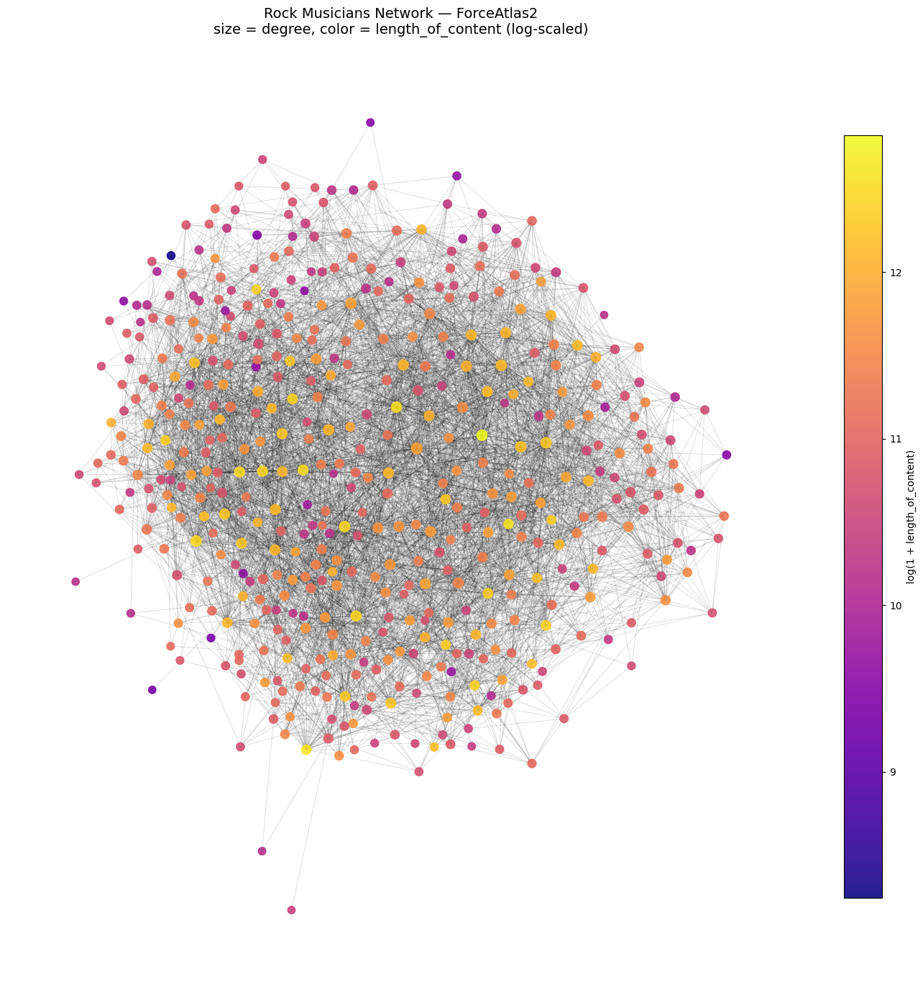

In [3]:
# Visualize the rock musician network using the ForceAtlas2 layout.

import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from pyforceatlas2 import ForceAtlas2

# Convert to undirected graph
G_u = G.to_undirected()

# Extract the Giant Connected Component (GCC)
gcc_nodes = max(nx.connected_components(G_u), key=len)
G_u = G_u.subgraph(gcc_nodes).copy()

# Compute node degree and visualization attributes
deg = np.array([G_u.degree(n) for n in G_u.nodes()])
deg_scaled = 50 + 6 * np.sqrt(deg)

lengths = np.array([G_u.nodes[n]["length_of_content"] for n in G_u.nodes()])
lengths_log = np.log1p(lengths)

# Apply ForceAtlas2 layout
forceatlas2 = ForceAtlas2(
    outbound_attraction_distribution=True,
    barnes_hut_optimize=True,
    barnes_hut_theta=1.2,
    scaling_ratio=2.0,
    gravity=0.5,
    verbose=False
)

pos = forceatlas2.forceatlas2_networkx_layout(G_u, pos=None, iterations=1500)

# Plot the network
plt.figure(figsize=(14, 14))
nodes = nx.draw_networkx_nodes(
    G_u, pos,
    node_size=deg_scaled,
    node_color=lengths_log,
    cmap=plt.cm.plasma,
    alpha=0.9
)
nx.draw_networkx_edges(G_u, pos, alpha=0.15, width=0.6)

plt.title("Rock Musicians Network — ForceAtlas2\nsize = degree, color = length_of_content (log-scaled)", fontsize=14)
cb = plt.colorbar(nodes, shrink=0.8)
cb.set_label("log(1 + length_of_content)")
plt.axis("off")
plt.tight_layout()
plt.show()

## 2. Degree Distribution 
In this section, we analyze how musicians connect to each other on Wikipedia. We look at the most connected artists (by in-degree and out-degree), plot the overall relationship between incoming and outgoing links, and explore which artists link to many others or are often linked to.

In [5]:
# Top 5 by in-degree
top_in = sorted(G.in_degree(), key=lambda x: x[1], reverse=True)[:5]
print("Top 5 performers by in-degree:")
for name, deg in top_in:
    print(f"{name}: {deg} incoming links")

# Top 5 by out-degree
top_out = sorted(G.out_degree(), key=lambda x: x[1], reverse=True)[:5]
print("\nTop 5 performers by out-degree:")
for name, deg in top_out:
    print(f"{name}: {deg} outgoing links")

Top 5 performers by in-degree:
Led_Zeppelin: 119 incoming links
Bob_Dylan: 95 incoming links
Queen_(band): 88 incoming links
Metallica: 85 incoming links
David_Bowie: 84 incoming links

Top 5 performers by out-degree:
Alice_in_Chains: 71 outgoing links
Deep_Purple: 69 outgoing links
Black_Sabbath: 59 outgoing links
Def_Leppard: 51 outgoing links
Bryan_Adams: 50 outgoing links


Artists with high in-degree, such as Led Zeppelin or Bob Dylan, are mentioned by many others, showing they are influential or well-known.
Those with high out-degree, like Alice in Chains or Deep Purple, tend to mention many other bands, often because of collaborations, tours, or shared members.
In general, high in-degree reflects popularity or influence, while high out-degree shows active connections to others.

After identifying the top artists, we next examine how in-degree and out-degree are related across all musicians.

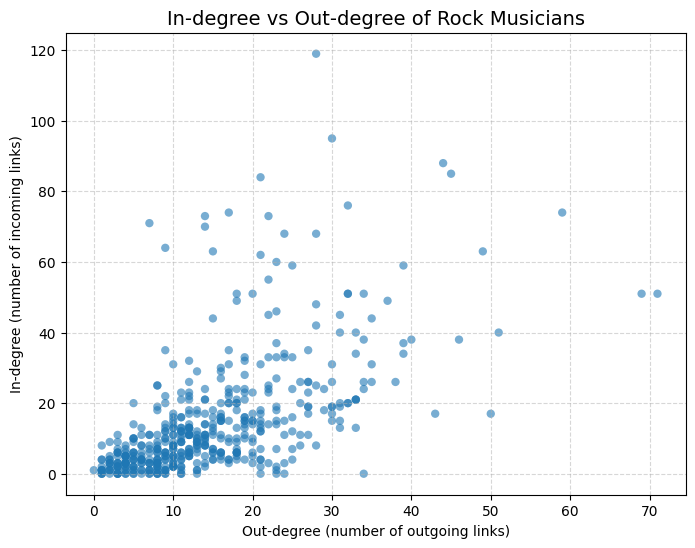

In [10]:
# Scatter plot: In-degree vs Out-degree
import matplotlib.pyplot as plt

# Calculate in-degree and out-degree for all nodes
in_degrees = [deg for _, deg in G.in_degree()]
out_degrees = [deg for _, deg in G.out_degree()]

# Create scatter plot
plt.figure(figsize=(8,6))
plt.scatter(out_degrees, in_degrees, alpha=0.6, edgecolors='none')

plt.title("In-degree vs Out-degree of Rock Musicians", fontsize=14)
plt.xlabel("Out-degree (number of outgoing links)")
plt.ylabel("In-degree (number of incoming links)")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

From the scatter plot, most musicians have low in- and out-degree, so they’re not very connected. A few artists stand out with higher degrees, but there isn’t a strong pattern between the two. Being well-known doesn’t always mean they link to many others, and those who link to many pages aren’t always the most famous.

We also checked whether some musicians have many outgoing links but few incoming ones (and vice versa).
These cases exist — for example, bands like Mötley Crüe or Midnight Oil often mention many others but aren’t linked back as much, while artists like Elvis Presley or Pink Floyd are mentioned by many but rarely link out.
This pattern shows that some musicians act as connectors, while others are more like central references in the network.

## 3. Advanced Degree Analysis

In this part, we take a closer look at how the connections are distributed in our directed network. We calculate some basic statistics of the in-degree and out-degree, then check if they follow a power-law pattern. This helps us understand whether a few musicians dominate the network while most have only a few links.

Before fitting the distributions, we also checked the basic statistics. The average in-degree and out-degree are both around 15, but a few artists reach much higher values (up to 119 in-degree and 71 out-degree). This shows that most musicians connect to only a few others, while a small number of hubs dominate the network.

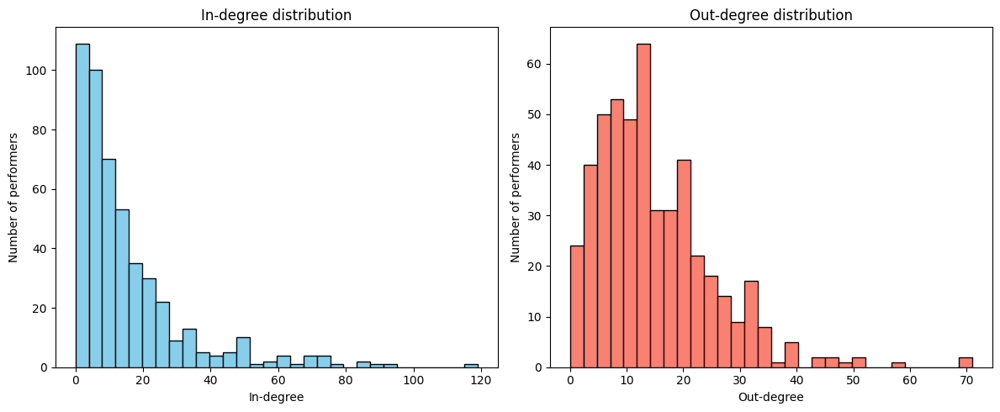

In [15]:
# In/out degree distribution
import matplotlib.pyplot as plt

in_degrees = [d for n, d in G.in_degree()]
out_degrees = [d for n, d in G.out_degree()]

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(in_degrees, bins=30, color='skyblue', edgecolor='black')
plt.title("In-degree distribution")
plt.xlabel("In-degree")
plt.ylabel("Number of performers")

plt.subplot(1, 2, 2)
plt.hist(out_degrees, bins=30, color='salmon', edgecolor='black')
plt.title("Out-degree distribution")
plt.xlabel("Out-degree")
plt.ylabel("Number of performers")

plt.tight_layout()
plt.show()

In [16]:
import powerlaw

# Fit power law for in- and out-degree
fit_in = powerlaw.Fit(in_degrees)
fit_out = powerlaw.Fit(out_degrees)

print(f"In-degree alpha: {fit_in.alpha:.2f}")
print(f"Out-degree alpha: {fit_out.alpha:.2f}")

Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
In-degree alpha: 2.71
Out-degree alpha: 6.23


Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values


When we used the powerlaw package, the in-degree alpha was about 2.7, and the out-degree alpha was around 6.2. This means the in-degree follows a power-law pretty well — a few famous musicians get many links, while most get only a few. The out-degree, though, drops off too fast and probably fits better with an exponential pattern. Compared to last week’s plots, this is consistent: the in-degree shows a long tail with some “hub” artists, but the out-degree looks more limited. Overall, our results match earlier Wikipedia studies — the network is partly scale-free, mostly because of the in-degree side.



Spearman  length vs out-degree: 0.6724811557963065 p= 2.1877196752780305e-65
Spearman  length vs in-degree : 0.6182871564430173 p= 1.0798742375166983e-52
Pearson   length vs out-degree: 0.6374592850709075 p= 6.815052291276424e-57
Pearson   length vs in-degree : 0.6536703041523384 p= 1.1026157242768187e-60


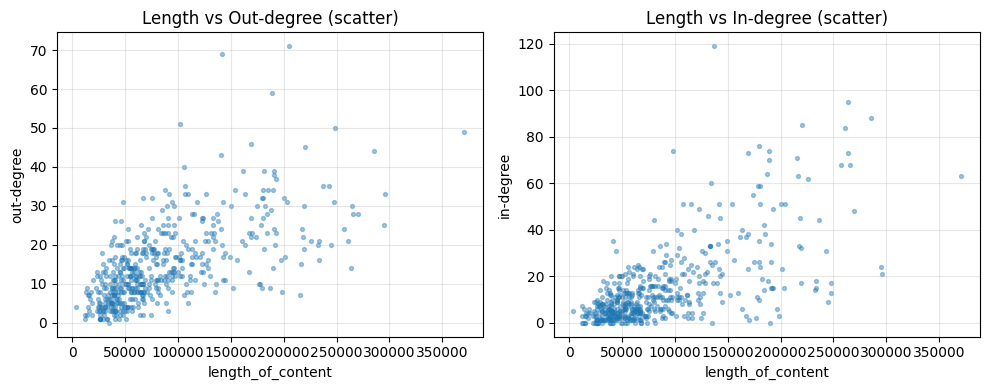

In [17]:
import numpy as np
from scipy.stats import spearmanr, pearsonr

nodes = list(G.nodes())
lengths = np.array([G.nodes[n]["length_of_content"] for n in nodes], dtype=float)
out_deg = np.array([G.out_degree(n) for n in nodes], dtype=float)
in_deg  = np.array([G.in_degree(n) for n in nodes], dtype=float)

# Calculate correlations
sp_len_out = spearmanr(lengths, out_deg, nan_policy="omit")
sp_len_in  = spearmanr(lengths, in_deg,  nan_policy="omit")
pe_len_out = pearsonr(lengths, out_deg)
pe_len_in  = pearsonr(lengths, in_deg)

print("Spearman  length vs out-degree:", sp_len_out.correlation, "p=", sp_len_out.pvalue)
print("Spearman  length vs in-degree :", sp_len_in.correlation,  "p=", sp_len_in.pvalue)
print("Pearson   length vs out-degree:", pe_len_out[0],         "p=", pe_len_out[1])
print("Pearson   length vs in-degree :", pe_len_in[0],          "p=", pe_len_in[1])

# Make simple scatter plots to visualize trends
import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.scatter(lengths, out_deg, s=8, alpha=0.4)
plt.xlabel("length_of_content")
plt.ylabel("out-degree")
plt.title("Length vs Out-degree (scatter)")
plt.grid(True, alpha=0.3)

plt.subplot(1,2,2)
plt.scatter(lengths, in_deg, s=8, alpha=0.4)
plt.xlabel("length_of_content")
plt.ylabel("in-degree")
plt.title("Length vs In-degree (scatter)")
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

After checking the correlations, both in-degree and out-degree go up with page length. Longer pages usually have more links overall. Out-degree shows a slightly stronger relation — probably because longer articles just contain more text and references, so they link out more often. In-degree is also positive but weaker, meaning long pages are also a bit more “famous” and linked by others.


## 4: Centralities, Assortativity and Shortest Paths

In this part, we apply several centrality and network structure measures to identify which musicians are the most influential and to understand how information or influence might flow through the rock musician network. 
We analyze degree, betweenness, and eigenvector centrality, then evaluate assortativity and shortest path length 
to describe the overall organization of the network.

Top 5 by total degree centrality:
Led_Zeppelin: 0.3025
Black_Sabbath: 0.2737
Queen_(band): 0.2716
Metallica: 0.2675
Bob_Dylan: 0.2572


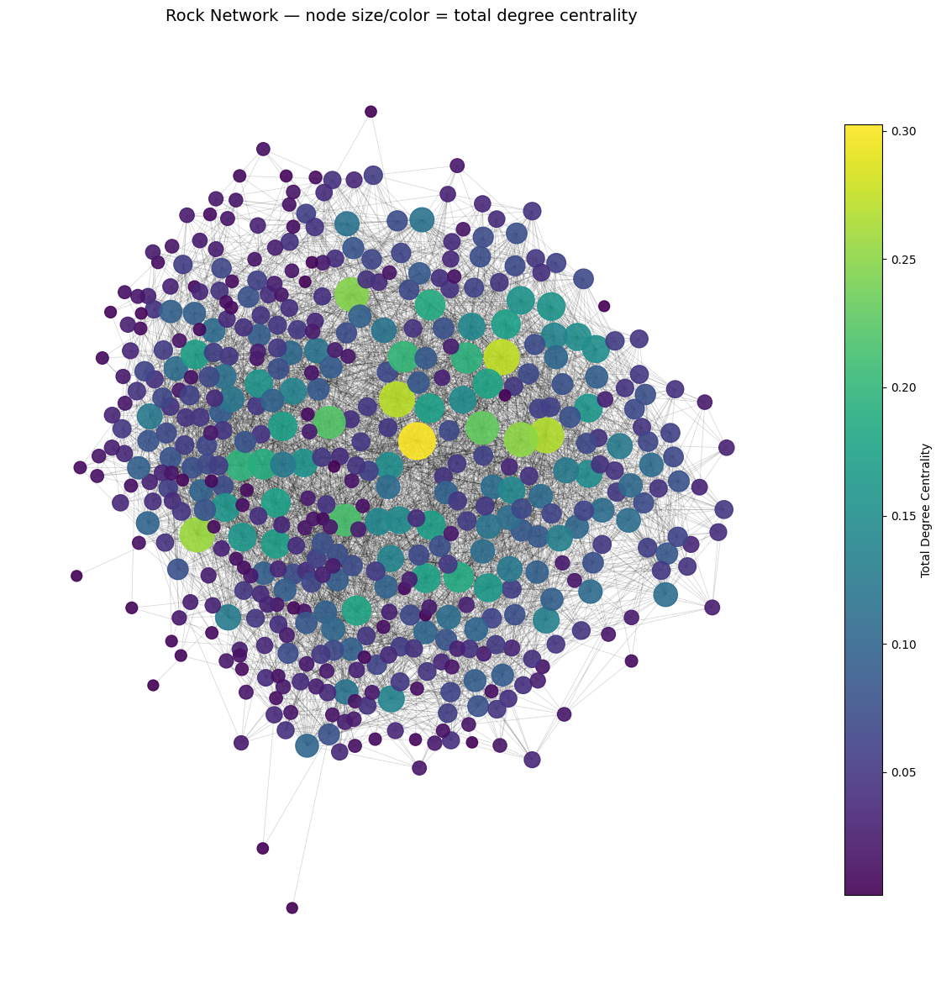

In [4]:
# Question 1: Degree Centrality
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Compute degree centrality 
deg_cent_total = nx.degree_centrality(G)

# Print top 5
top5_total = sorted(deg_cent_total.items(), key=lambda x: x[1], reverse=True)[:5]
print("Top 5 by total degree centrality:")
for n, c in top5_total:
    print(f"{n}: {c:.4f}")

# Visualization 
deg_vals = np.array([deg_cent_total.get(n, 0.0) for n in G_u.nodes()])
node_sizes  = 80 + 3000 * deg_vals
node_colors = deg_vals

plt.figure(figsize=(12, 12))
nx.draw_networkx_edges(G_u, pos, alpha=0.15, width=0.6)
nc = nx.draw_networkx_nodes(
    G_u, pos,
    node_size=node_sizes,
    node_color=node_colors,
    cmap=plt.cm.viridis,
    alpha=0.9
)
plt.colorbar(nc, shrink=0.8, label="Total Degree Centrality")
plt.title("Rock Network — node size/color = total degree centrality", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

Top 5 by betweenness centrality:
Deep_Purple: 0.0428
Queen_(band): 0.0397
Alice_in_Chains: 0.0384
Guns_N'_Roses: 0.0365
Jimi_Hendrix: 0.0334


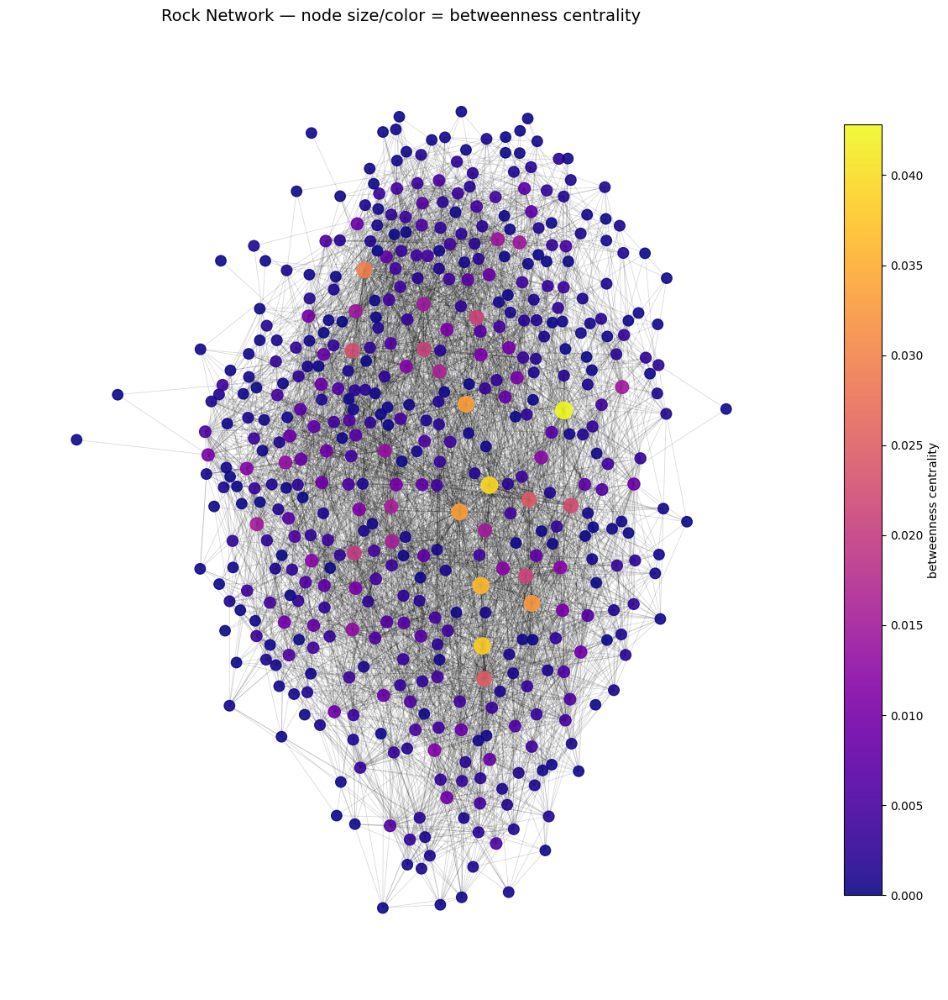

In [19]:
# Question 2 betweenness centrality
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Calculate betweenness
bet = nx.betweenness_centrality(G, normalized=True)

# Print top 5
top5_bet = sorted(bet.items(), key=lambda x: x[1], reverse=True)[:5]
print("Top 5 by betweenness centrality:")
for n, c in top5_bet:
    print(f"{n}: {c:.4f}")

# Plot 
bvals = np.array([bet.get(n, 0.0) for n in G_u.nodes()])
node_sizes  = 80 + 3000 * bvals
node_colors = bvals

plt.figure(figsize=(12, 12))
nx.draw_networkx_edges(G_u, pos, alpha=0.15, width=0.6)
nc = nx.draw_networkx_nodes(
    G_u, pos,
    node_size=node_sizes,
    node_color=node_colors,
    cmap=plt.cm.plasma,
    alpha=0.9
)
plt.colorbar(nc, shrink=0.8, label="betweenness centrality")
plt.title("Rock Network — node size/color = betweenness centrality", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

The artists with high betweenness centrality seem to work as bridges in the network.
They link different parts of the rock music world together. for example, connecting classic rock bands with newer ones.
So they help the network stay connected overall.

Top 5 by OUT-eigenvector centrality:
Led_Zeppelin: 0.2304
Black_Sabbath: 0.1910
Queen_(band): 0.1818
Metallica: 0.1795
David_Bowie: 0.1593

Top 5 by IN-eigenvector centrality:
Alice_in_Chains: 0.2006
Black_Sabbath: 0.1747
Deep_Purple: 0.1671
Metallica: 0.1576
Megadeth: 0.1519


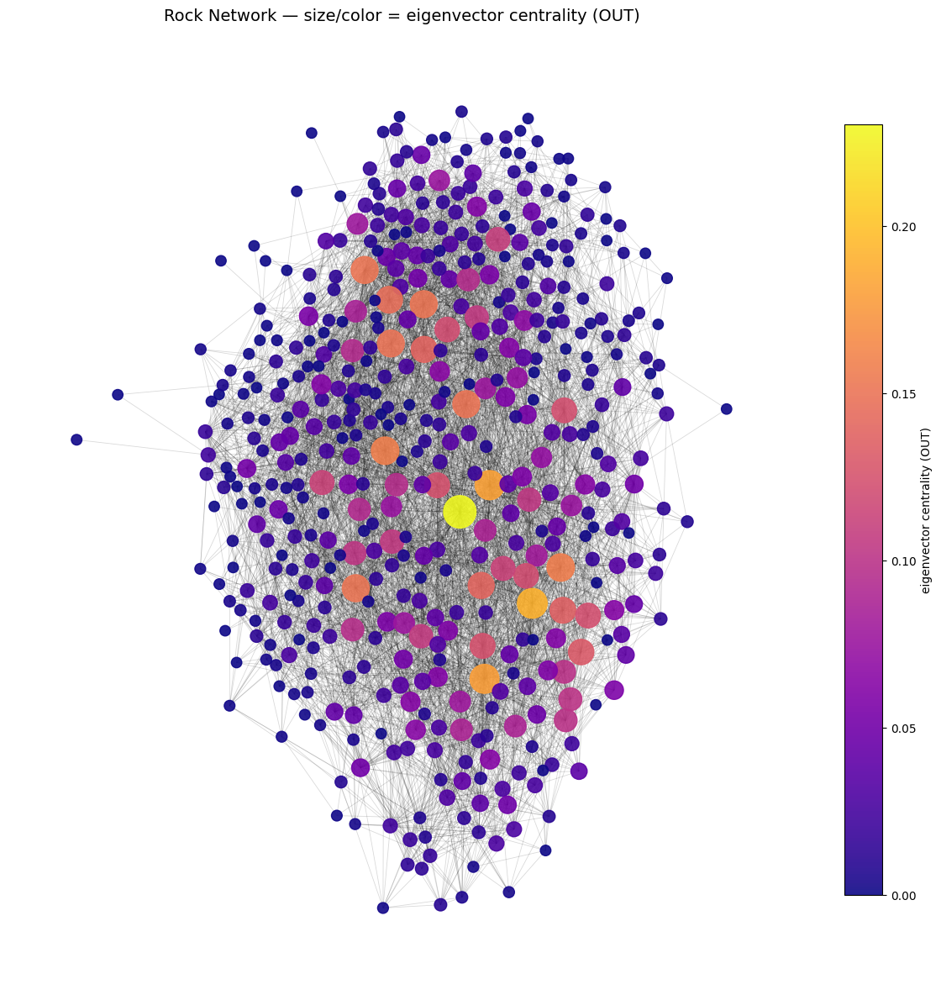

In [20]:
# Question 3 eigenvector centrality 

import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Compute out-/in- eigenvector
eig_out = nx.eigenvector_centrality(G, max_iter=1000, tol=1e-06)
eig_in  = nx.eigenvector_centrality(G.reverse(copy=False), max_iter=1000, tol=1e-06)

# Print top 5
def top5(d):
    return sorted(d.items(), key=lambda x: x[1], reverse=True)[:5]

print("Top 5 by OUT-eigenvector centrality:")
for n, c in top5(eig_out):
    print(f"{n}: {c:.4f}")

print("\nTop 5 by IN-eigenvector centrality:")
for n, c in top5(eig_in):
    print(f"{n}: {c:.4f}")

# Plot
vals = np.array([eig_out.get(n, 0.0) for n in G_u.nodes()])
node_sizes  = 80 + 3000 * vals  
node_colors = vals

plt.figure(figsize=(12, 12))
nx.draw_networkx_edges(G_u, pos, alpha=0.15, width=0.6)
nc = nx.draw_networkx_nodes(
    G_u, pos,
    node_size=node_sizes,
    node_color=node_colors,
    cmap=plt.cm.plasma,
    alpha=0.9
)
plt.colorbar(nc, shrink=0.8, label="eigenvector centrality (OUT)")
plt.title("Rock Network — size/color = eigenvector centrality (OUT)", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()

Artists with high eigenvector centrality are usually big, well-known bands that are connected to other famous ones — they sit in the middle of the rock network. Compared to betweenness centrality, which shows musicians that act as bridges between different groups, eigenvector centrality highlights the "core" ones who are part of the main cluster. So basically, betweenness shows the connectors, and eigenvector shows the popular hubs.

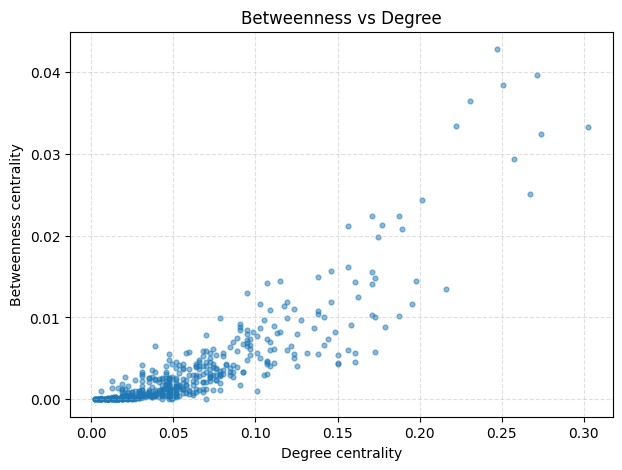

In [22]:
# Question 4 betweenness vs degree

import matplotlib.pyplot as plt
import networkx as nx

deg_cent = nx.degree_centrality(G)         
bet_cent = nx.betweenness_centrality(G)   

x = [deg_cent[n] for n in G.nodes()]
y = [bet_cent[n] for n in G.nodes()]

plt.figure(figsize=(7,5))
plt.scatter(x, y, s=12, alpha=0.5)
plt.xlabel("Degree centrality")
plt.ylabel("Betweenness centrality")
plt.title("Betweenness vs Degree")
plt.grid(True, ls="--", alpha=0.4)
plt.show()

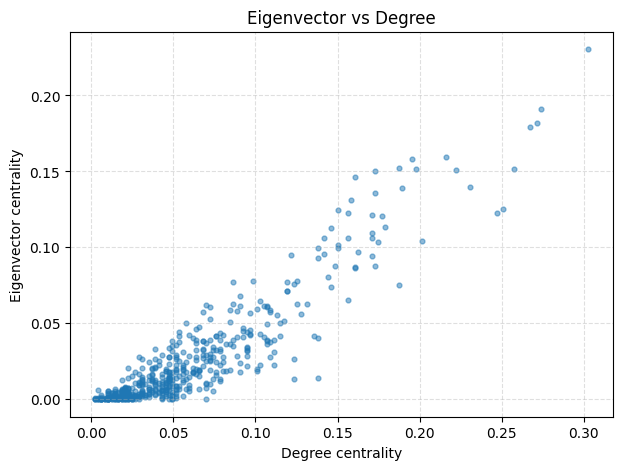

In [23]:
# Question 4 eigenvector vs degree 

eig_cent = nx.eigenvector_centrality(G, max_iter=1000) 

x = [deg_cent[n] for n in G.nodes()]
y = [eig_cent[n] for n in G.nodes()]

plt.figure(figsize=(7,5))
plt.scatter(x, y, s=12, alpha=0.5)
plt.xlabel("Degree centrality")
plt.ylabel("Eigenvector centrality")
plt.title("Eigenvector vs Degree")
plt.grid(True, ls="--", alpha=0.4)
plt.show()

There is a clear positive correlation between degree and betweenness — nodes with more links tend to be more central, which makes sense. Still, a few low-degree nodes show high betweenness because they act as bridges between groups. When using eigenvector centrality instead, the trend looks smoother and stronger, as nodes connected to other important ones also get higher scores.

In [24]:
# Question 5

r = nx.degree_assortativity_coefficient(G_u)
print(f"Degree assortativity coefficient: {r:.3f}")

Degree assortativity coefficient: 0.004


The assortativity coefficient is about 0.004, which is close to zero. So the network doesn’t really show a clear pattern — high-degree and low-degree musicians connect pretty randomly.

In [25]:
# Question 6

r_attr = nx.attribute_assortativity_coefficient(G_u, "length_of_content")

print(f"attribute_assortativity_coefficient: {r_attr:.3f}")

attribute_assortativity_coefficient: -0.003


The assortativity with respect to length_of_content is close to zero (r = –0.003), which means page length has little effect on connections. Long pages often link to short ones, showing that Wikipedia links are quite mixed and not length-based.

[Real] n=487, m=6008, implied p≈0.050769
[Real] average shortest path length: 2.376
[ER]   average shortest path length: 2.226


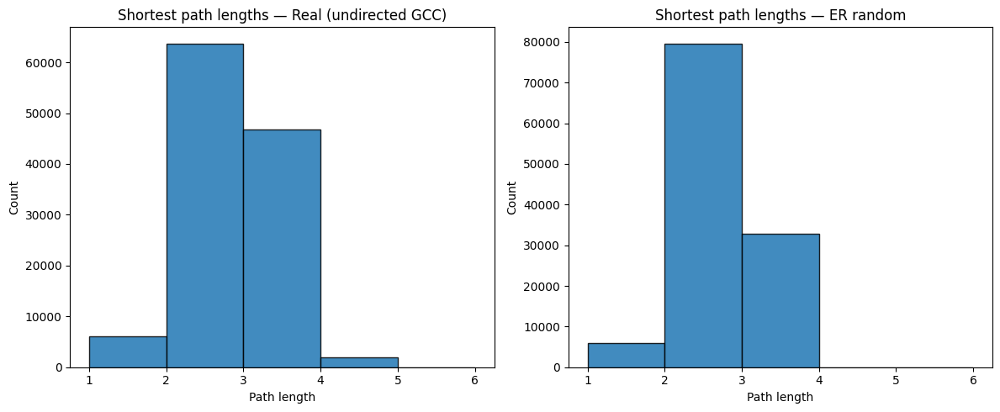

In [26]:
# Questiopn 7
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Basic stats 
n = G_u.number_of_nodes()
m = G_u.number_of_edges()
p = 2 * m / (n * (n - 1)) 
print(f"[Real] n={n}, m={m}, implied p≈{p:.6f}")

# Average shortest path length on the real network
asp_real = nx.average_shortest_path_length(G_u)
print(f"[Real] average shortest path length: {asp_real:.3f}")

# Build a matching ER(n, p) random graph and keep its GCC
seed = 42
G_rand = nx.erdos_renyi_graph(n=n, p=p, seed=seed)
if not nx.is_connected(G_rand):
    gcc_er = max(nx.connected_components(G_rand), key=len)
    G_rand = G_rand.subgraph(gcc_er).copy()

asp_rand = nx.average_shortest_path_length(G_rand)
print(f"[ER]   average shortest path length: {asp_rand:.3f}")

# Collect shortest path lengths 
def unique_pair_lengths(G):
    lengths = []
    nodes = list(G.nodes())
    idx = {u: i for i, u in enumerate(nodes)}
    for u, dist_map in nx.all_pairs_shortest_path_length(G):
        iu = idx[u]
        for v, d in dist_map.items():
            if d > 0 and iu < idx[v]:   # count each undirected pair once
                lengths.append(d)
    return lengths

dist_real = unique_pair_lengths(G_u)
dist_er   = unique_pair_lengths(G_rand)

# Plot
max_len = max(max(dist_real), max(dist_er))
bins = np.arange(1, int(max_len) + 2)  # 1,2,3,...,max_len

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(dist_real, bins=bins, edgecolor='black', alpha=0.85)
plt.title("Shortest path lengths — Real (undirected GCC)")
plt.xlabel("Path length"); plt.ylabel("Count")

plt.subplot(1, 2, 2)
plt.hist(dist_er, bins=bins, edgecolor='black', alpha=0.85)
plt.title("Shortest path lengths — ER random")
plt.xlabel("Path length"); plt.ylabel("Count")

plt.tight_layout()
plt.show()

For the undirected network, the average shortest path length is 2.376, which is close to the random graph’s 2.226. This means our network has small-world characteristics — most nodes are only two or three steps apart. The histogram shows that both graphs have short path lengths, but the real network’s distribution is a bit wider, suggesting more local clusters or communities compared to the random network.

## 5. Network Backbone Visualization

In this section, we extracted and compared three backbones of the rock musician network. Each backbone keeps only the strongest or most important connections, allowing us to better visualize the main structure of the network.

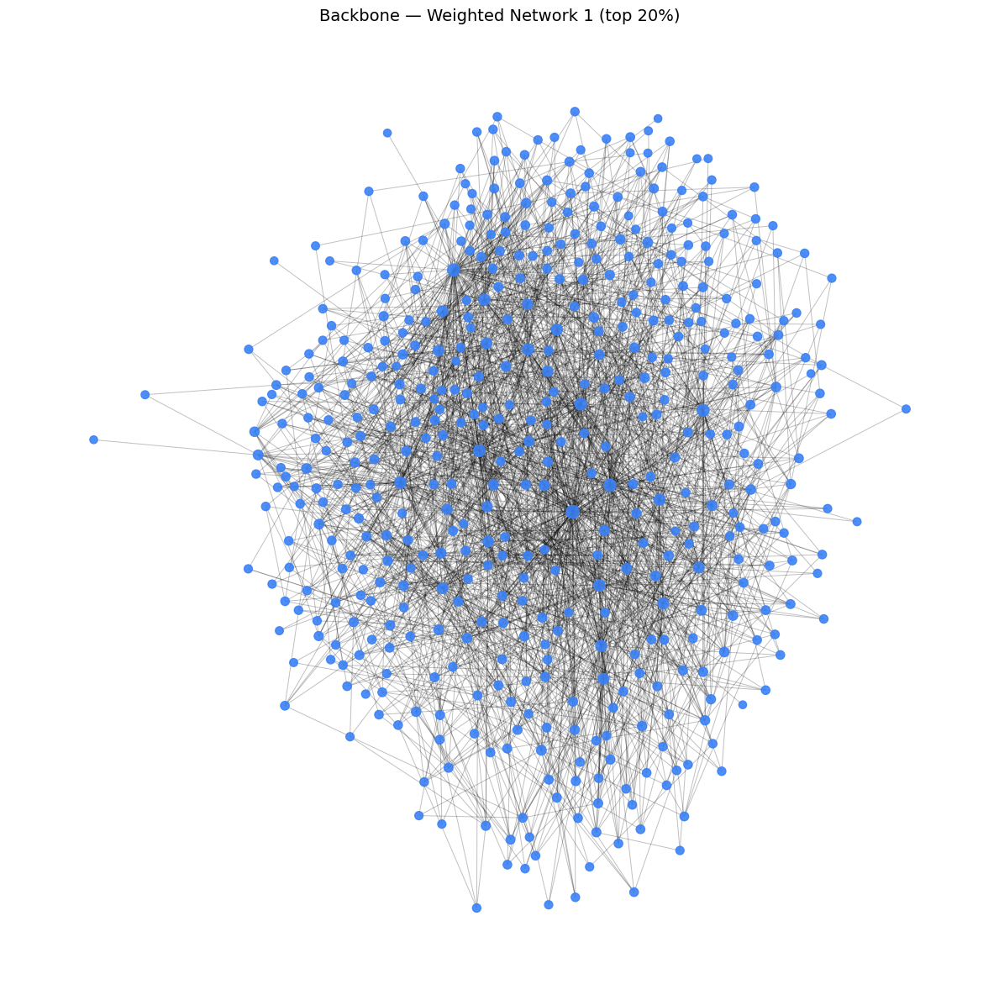

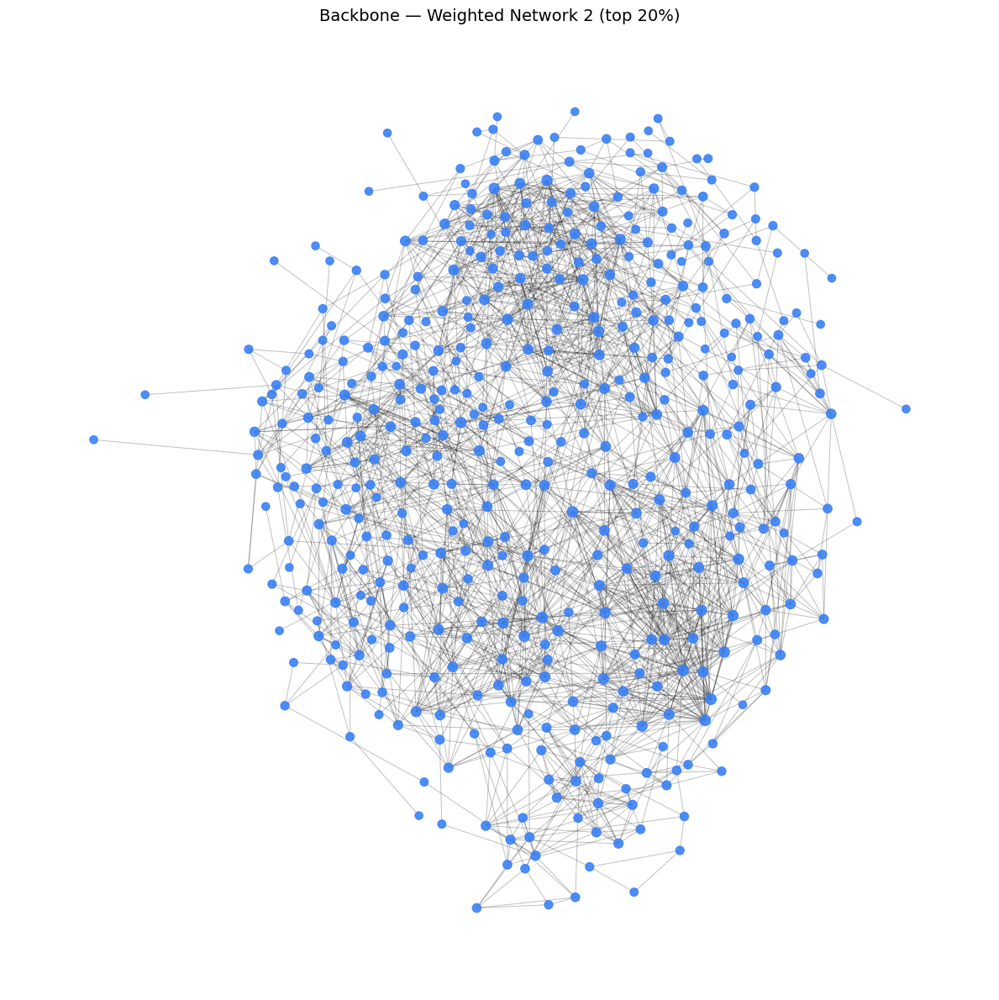

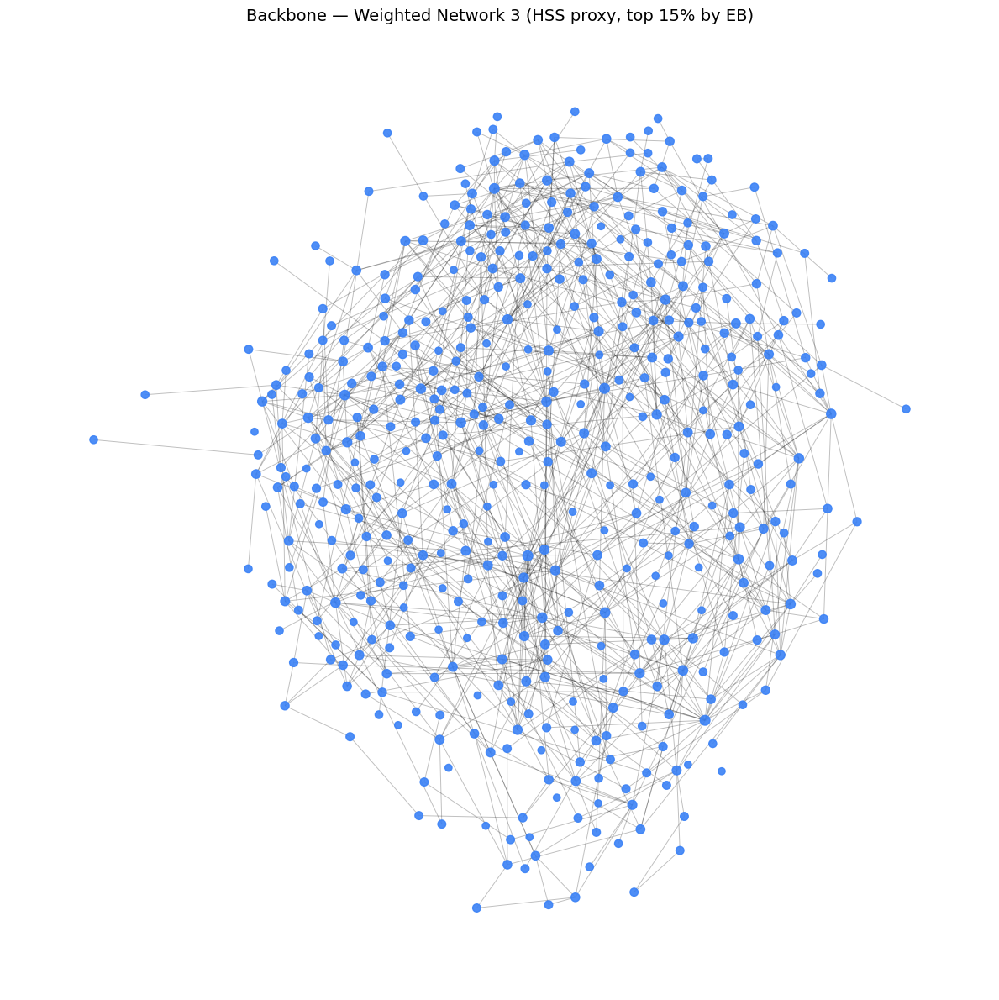

In [28]:
# Exercise 5

import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

def minmax_rescale(arr, a=1.0, b=100.0):
    arr = np.asarray(arr, dtype=float)
    lo, hi = arr.min(), arr.max()
    if hi == lo:
        return np.full_like(arr, a)
    return a + (b - a) * (arr - lo) / (hi - lo)

def build_graph_with_weights(G_base, weight_dict):
    """Return a new Graph with the same nodes and weighted edges from weight_dict."""
    H = nx.Graph()
    H.add_nodes_from(G_base.nodes())
    for (u, v), w in weight_dict.items():
        if H.has_edge(u, v):
            # if multi-edges somehow appeared, keep the max
            H[u][v]['weight'] = max(H[u][v]['weight'], float(w))
        else:
            H.add_edge(u, v, weight=float(w))
    return H

def pernode_top_fraction_backbone(Gw, top_frac=0.20):
    """
    Keep an edge if it is among the top-fraction (by normalized share p_ij = w_ij/s_i)
    of incident edges at node u OR at node v.
    This preserves locally-significant ties and avoids over-pruning.
    """
    B = nx.Graph()
    B.add_nodes_from(Gw.nodes())

    # Precompute strength and normalized shares
    strengths = {n: sum(d.get("weight", 1.0) for _, _, d in Gw.edges(n, data=True)) for n in Gw.nodes()}
    nbr_shares = {}
    for n in Gw.nodes():
        s = strengths[n]
        if s <= 0.0:
            nbr_shares[n] = {}
            continue
        shares = {}
        for nbr, d in Gw[n].items():
            w = d.get("weight", 1.0)
            shares[nbr] = w / s
        # sort neighbors by share desc
        sorted_nbrs = sorted(shares.items(), key=lambda x: x[1], reverse=True)
        k = len(sorted_nbrs)
        keep_k = max(1, int(np.ceil(top_frac * k)))  # keep at least 1
        nbr_shares[n] = {nbr for nbr, _ in sorted_nbrs[:keep_k]}

    # keep edge if it's in top list of either endpoint
    for u, v, d in Gw.edges(data=True):
        if (v in nbr_shares.get(u, set())) or (u in nbr_shares.get(v, set())):
            B.add_edge(u, v, **d)
    return B

def draw_backbone(Gb, pos, title):
    deg = np.array([Gb.degree(n) for n in Gb.nodes()])
    sizes = 36 + 8 * np.sqrt(deg)
    plt.figure(figsize=(12, 12))
    nx.draw_networkx_edges(Gb, pos, alpha=0.25, width=0.7)
    nx.draw_networkx_nodes(Gb, pos, node_size=sizes, node_color="#3B82F6", alpha=0.9)
    plt.title(title, fontsize=14)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

#  W1: weight = edge betweenness (rescaled to [1,100]) 

# unweighted betweenness on the undirected network (as the assignment suggests)
eb_raw = nx.edge_betweenness_centrality(G_u, normalized=True)
w1_vals = minmax_rescale(np.array(list(eb_raw.values())), 1.0, 100.0)
w1_dict = {e: float(w) for e, w in zip(eb_raw.keys(), w1_vals)}
W1 = build_graph_with_weights(G_u, w1_dict)

# W2: weight = 1 / W1_weight, then rescale again to [1,100] 

w2_inv = np.array([1.0 / w for w in w1_vals])
w2_vals = minmax_rescale(w2_inv, 1.0, 100.0)  # re-scale to keep numerics sane
w2_dict = {e: float(w) for e, w in zip(eb_raw.keys(), w2_vals)}
W2 = build_graph_with_weights(G_u, w2_dict)

# Backbones 
# Use per-node top-fraction backbone (locally significant ties)
TOP_FRAC = 0.20  # try 0.15 ~ 0.30 depending on how sparse you want

BB1 = pernode_top_fraction_backbone(W1, top_frac=TOP_FRAC)
BB2 = pernode_top_fraction_backbone(W2, top_frac=TOP_FRAC)

# HSS proxy = keep top-q edges by global edge betweenness (on W1)
KEEP_TOP = 0.15  # 10%~25% are common choices
eb_w1 = nx.edge_betweenness_centrality(W1, normalized=True, weight="weight")
sorted_edges = sorted(eb_w1.items(), key=lambda x: x[1], reverse=True)
k_top = max(1, int(len(sorted_edges) * KEEP_TOP))
keep_set = {e for e, _ in sorted_edges[:k_top]}

BB3 = nx.Graph()
BB3.add_nodes_from(W1.nodes())
for u, v, d in W1.edges(data=True):
    if (u, v) in keep_set or (v, u) in keep_set:
        BB3.add_edge(u, v, **d)

# Plot
draw_backbone(BB1, pos, f"Backbone — Weighted Network 1 (top {int(TOP_FRAC*100)}%)")
draw_backbone(BB2, pos, f"Backbone — Weighted Network 2 (top {int(TOP_FRAC*100)}%)")
draw_backbone(BB3, pos, f"Backbone — Weighted Network 3 (HSS proxy, top {int(KEEP_TOP*100)}% by EB)")

The three backbone networks look quite different. In W1, where edge weights come from betweenness, the network keeps many global links — it still looks dense in the center, showing the main “roads” that connect different groups.
In W2, where weights are based on 1/betweenness, the result is more clustered — mostly local links remain inside communities, and long bridges are gone. The W3 (HSS proxy) version sits between the two: it’s cleaner and shows the key structure without too many edges. Overall, W1 shows the global backbone, W2 highlights local clusters, and W3 gives a good balance between the two.


# Part 2: Genres and communities and plotting 

The questions below are based on Lecture 7, part 2.

* Write about genres and modularity.

Answer:

In the context of rock artist network, we use genres as a predefined set of communities to test this concept. The underlying hypothesis is that artists of the same genre are more likely to be linked than artists of different genres. If this is true, partitioning the network by genre should yield a positive modularity score.

Modularity is a measure of the strength of a network's division into communities. It quantifies how densely connected the nodes within a community are, compared to how connected they would be in a random network. A positive modularity score indicates that the internal connections are denser than expected by chance, suggesting a meaningful partition.

* Detect the communities, discuss the value of modularity in comparison to the genres.

Answer:

Comparing the Louvain score (0.3028) with the "First Genre" score (0.1681). The Louvain algorithm found a partition that is nearly two times stronger in modularity than the one defined by genres.
The gap between the two scores quantifies the difference between mathematical optimum and real-world classification.

* Calculate the matrix $D$ and discuss your findings.

Answer:

The confusion matrix shows that the detected communities correspond reasonably well to the major musical genres. Each of the primary Louvain communities aligns with specific genre clusters: C0 is dominated by rock and roll; C1  is strongly associated with hard rock, pop rock and rock and roll; C2 has a clear concentration of alternative rock; and C3 represents a blend of alternative rock, hard rock, and alternative metal; C4 is dominated by alternative rock; C5 is dominated by alternative rock; C6 is associated with hard rock and blues rock.

In [18]:
import networkx as nx
import random

# --- Step 1: Prepare the Network ---

# The exercise specifies working from an UNDIRECTED version of the network.
G_undirected = G.to_undirected()

# keep only the nodes for which have genre information.
nodes_with_genres = list(artist_genres.keys())
G_genres = G_undirected.subgraph(nodes_with_genres)

# the size of our working network
print(f"Working with {G_genres.number_of_nodes()} nodes and {G_genres.number_of_edges()} edges.")


# --- Step 2: Partition by the FIRST Genre ---

# We'll create a dictionary where keys are genres and values are lists of artists.
communities_by_first_genre = {}
for artist, genres in artist_genres.items():
    # Ensure the artist is in our subgraph and has genres
    if artist in G_genres.nodes() and genres:
        first_genre = genres[0]  # Get the first genre in the list
        if first_genre not in communities_by_first_genre:
            communities_by_first_genre[first_genre] = []
        communities_by_first_genre[first_genre].append(artist)

# The modularity function requires a list of sets (one set per community).
partition1 = [set(nodes) for nodes in communities_by_first_genre.values()]

# Calculate and print the modularity
modularity1 = nx.community.modularity(G_genres, partition1)
print(f"\nModularity when partitioning by the FIRST genre: {modularity1:.4f}")


# Get the list of nodes that have at least one genre
nodes_with_genres = list(artist_genres.keys())

# The louvain_communities function returns a list of sets (the partition)
# We use a seed for reproducibility of the results.
louvain_partition = nx.community.louvain_communities(G_genres, seed=77, resolution=1.5)

# Report the number of communities found
num_communities = len(louvain_partition)

# Pass the graph and the partition to the modularity function
modularity_score = nx.community.modularity(G_genres, louvain_partition)


# --- Step 4: Report the Final Results ---
print("\n" + "="*50)
print("RESULTS: LOUVAIN COMMUNITY DETECTION")
print("="*50)
print(f"Number of structural communities detected: {num_communities}")
print(f"The modularity of the Louvain partition is: {modularity_score:.4f}")
print("="*50)

Working with 481 nodes and 5997 edges.

Modularity when partitioning by the FIRST genre: 0.1681

RESULTS: LOUVAIN COMMUNITY DETECTION
Number of structural communities detected: 12
The modularity of the Louvain partition is: 0.3028


1. Reading from local files to find genres for 487 artists...
  -> Found genres for 481 artists.

2. Attaching extracted genres to graph nodes...
  -> Done.

3. Using existing Louvain partition...
  -> Found 12 communities in the existing partition.
  -> Top 7 Genres: ['hard rock', 'pop', 'alternative rock', 'rock and roll', 'punk rock', 'blues rock', 'alternative metal']
  -> Top 7 Community sizes: [84, 68, 66, 54, 51, 43, 40]

5. Visualizing the confusion matrix...


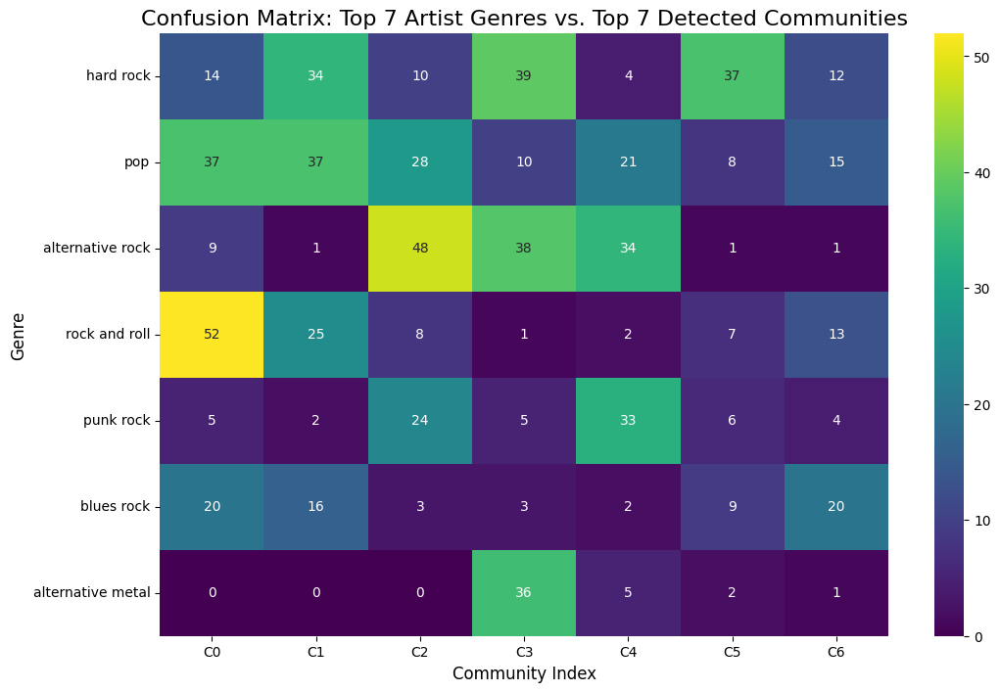

In [19]:
import os
import re
import html
import networkx as nx
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter

# --------------------------------------
# 2️⃣ Extract genres from local files
# --------------------------------------
nodes = G_undirected.nodes()
artist_genres = {}
data_dir = "rock_artists_pages"
print(f"1. Reading from local files to find genres for {len(nodes)} artists...")

for artist_name in nodes:
    file_path = os.path.join(data_dir, f"{artist_name}.txt")
    if os.path.exists(file_path):
        try:
            with open(file_path, 'r', encoding='utf-8') as f: 
                wikitext = f.read()
            if '{{Infobox musical artist' in wikitext:
                genre_match = re.search(r'\|\s*genre\s*=\s*(.*?)(?=\n\s*\|)', wikitext, re.IGNORECASE | re.DOTALL)
                if genre_match:
                    genres_found = definitive_genre_parser(genre_match.group(1))
                    if genres_found:
                        artist_genres[artist_name] = genres_found
        except Exception as e:
            print(f"Could not process file for {artist_name}: {e}")

print(f"  -> Found genres for {len(artist_genres)} artists.")

# --------------------------------------
# 3️⃣ Attach extracted genres to graph nodes
# --------------------------------------
print("\n2. Attaching extracted genres to graph nodes...")
for artist_name, genres_list in artist_genres.items():
    if artist_name in G_undirected:
        G_undirected.nodes[artist_name]['genres'] = genres_list
print("  -> Done.")

# --------------------------------------
# 4️⃣ Use existing Louvain partition
# --------------------------------------
print("\n3. Using existing Louvain partition...")
louvain_partition = nx.community.louvain_communities(G_genres, seed=77,resolution=1.5)
communities = sorted(louvain_partition, key=len, reverse=True)
print(f"  -> Found {len(communities)} communities in the existing partition.")

# --------------------------------------
# 5️⃣ Identify top 7 genres and communities
# --------------------------------------
all_genres_from_graph = []
for node, data in G_undirected.nodes(data=True):
    if 'genres' in data:
        all_genres_from_graph.extend(data['genres'])

genre_counts = Counter(all_genres_from_graph)
top_7_genres = [genre for genre, count in genre_counts.most_common(7)]

top_7_communities = communities[:7]

node_to_community = {}
for i, comm in enumerate(top_7_communities):
    for node in comm:
        node_to_community[node] = i

print(f"  -> Top 7 Genres: {top_7_genres}")
print(f"  -> Top 7 Community sizes: {[len(c) for c in top_7_communities]}")

# --------------------------------------
# 6️⃣ Build the confusion matrix
# --------------------------------------
D = pd.DataFrame(0, index=top_7_genres, columns=[f'C{i}' for i in range(len(top_7_communities))])

for node, data in G_undirected.nodes(data=True):
    if node in node_to_community and 'genres' in data:
        community_idx = node_to_community[node]
        for genre in data['genres']:
            if genre in top_7_genres:
                D.loc[genre, f'C{community_idx}'] += 1

# --------------------------------------
# 7️⃣ Visualize the confusion matrix

# --------------------------------------
print("\n5. Visualizing the confusion matrix...")
plt.figure(figsize=(12, 8))
sns.heatmap(D, annot=True, fmt='d', cmap='viridis')
plt.title('Confusion Matrix: Top 7 Artist Genres vs. Top 7 Detected Communities', fontsize=16)
plt.xlabel('Community Index', fontsize=12)
plt.ylabel('Genre', fontsize=12)
plt.show()

* Plot the communities and comment on your results.

Answer:

The visualization shows clear community structures among rock artists. The Louvain algorithm identifies several large clusters.The plot highlights how the rock artist network is highly interconnected, with a strong shared core and smaller, stylistically unique communities branching out from it.

1. Preparing data for visualization...
  -> Using a 12-color palette for communities.

2. Calculating the spring layout... (might take a while)
  -> Layout ready.

3. Drawing the network...


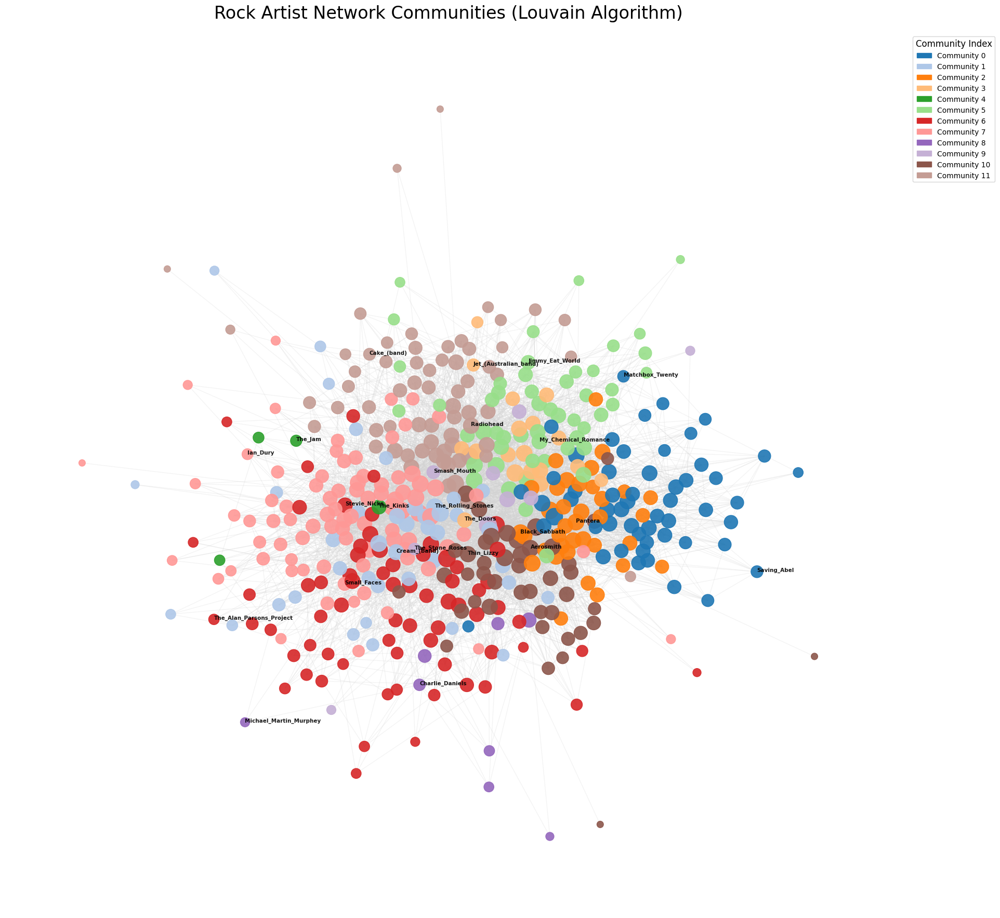

In [20]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
import seaborn as sns  # gives us beautiful distinct palettes

# --- Step 1: Prepare Data ---
print("1. Preparing data for visualization...")

node_to_community = {}
for i, comm in enumerate(louvain_partition):
    for node in comm:
        node_to_community[node] = i

num_communities = len(louvain_partition)
community_colors = [node_to_community.get(node) for node in G_genres.nodes()]
node_degrees = [G_genres.degree(n) for n in G_genres.nodes()]
node_sizes = [np.log(d + 1) * 120 for d in node_degrees]

# --- Step 2: Choose a Distinct Color Palette ---
# "tab20" is built-in; alternatively, seaborn has even cleaner palettes
palette = sns.color_palette("tab20", num_communities)
colors = np.array(palette)[community_colors]

print(f"  -> Using a {num_communities}-color palette for communities.")


# --- Step 3: Compute Layout ---
print("\n2. Calculating the spring layout... (might take a while)")
positions = nx.spring_layout(G_genres, seed=42, k=0.15, iterations=150)
print("  -> Layout ready.")


# --- Step 4: Draw the Network ---
print("\n3. Drawing the network...")

plt.figure(figsize=(22, 22))

nx.draw_networkx_edges(
    G_genres,
    positions,
    edge_color='lightgray',
    alpha=0.25
)

nx.draw_networkx_nodes(
    G_genres,
    positions,
    node_size=node_sizes,
    node_color=colors,
    alpha=0.9
)

# Label 2–3 artists per community (helps identify them visually)
for i, comm in enumerate(louvain_partition):
    sample_nodes = list(comm)[:2]  # only label first 2 nodes per community
    for n in sample_nodes:
        plt.text(
            positions[n][0],
            positions[n][1],
            n,
            fontsize=7.5,
            fontweight='bold',
            color='black',
            alpha=0.9
        )

# --- Step 5: Add Legend ---
patches = [mpatches.Patch(color=palette[i], label=f'Community {i}') for i in range(num_communities)]
plt.legend(
    handles=patches,
    title="Community Index",
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    fontsize=10,
    title_fontsize=12,
    frameon=True
)

plt.title('Rock Artist Network Communities (Louvain Algorithm)', fontsize=24, pad=20)
plt.axis('off')
plt.show()


# Part 3: TF-IDF to understand genres and communities 

The questions below  are based on Lecture 7, part 2, 4, 5, 6 (and a little bit on part 3).

* Explain the concept of TF-IDF in your own words and how it can help you understand the genres and communities.

Answer:

TF-IDF is a statistical measure that evaluates how important a word is to a document within a collection of documents.

It helps us understand what makes each music genre or community unique by highlighting words that are specific to them, while downweighting common words that appear everywhere.

* Calculate and visualize TF-IDF for the genres and communities.

* Use the matrix $D$ (Lecture 7, part 2) to dicusss the difference between the word-clouds between genres and communities.

Answer:

We can see that the Louvain communities don’t exactly match the genre labels but still capture some real structure. The confusion matrix shows that some genres, like alternative rock and blues rock, are mostly concentrated in one or two communities, while others such as pop and hard rock are more spread out. This means the clustering grouped artists more by text similarity than by their genre label.

1. Aggregating texts for the 4 detected communities...
  -> Community text aggregation complete.


             ANALYZING TF-IDF FOR GENRES

--- TOP 15 TF-IDF WORDS FOR: HARD ROCK ---
  Disturbed            0.5030
  Draiman              0.4054
  Donegan              0.2685
  Moyer                0.2568
  Sickness             0.1634
  Wengren              0.1634
  Indestructible       0.1401
  bar                  0.1194
  Fists                0.1167
  Kmak                 0.1167
  Dan                  0.1148
  tour                 0.1099
  Asylum               0.0934
  Awalt                0.0934
  announced            0.0902


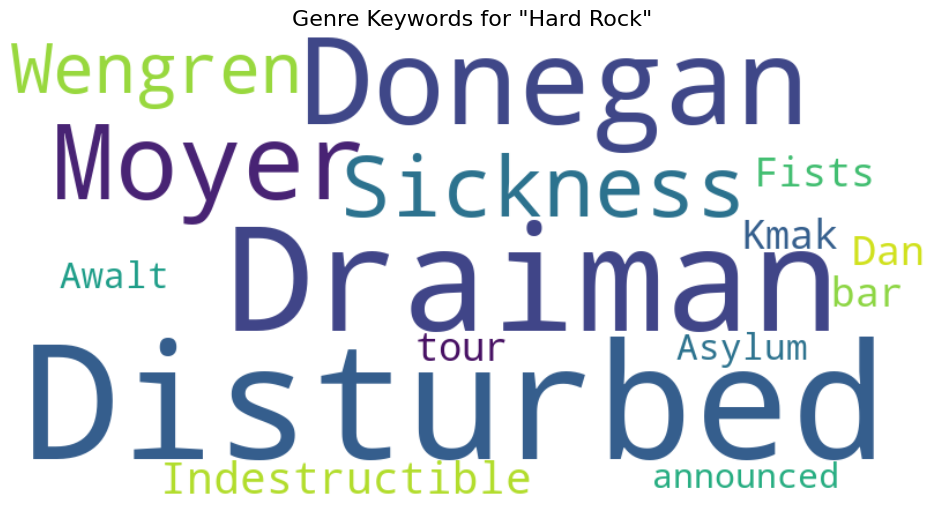


--- TOP 15 TF-IDF WORDS FOR: POP ---
  Linkin               0.4373
  Shinoda              0.3405
  Park                 0.3075
  Bennington           0.2792
  bar                  0.1966
  Delson               0.1647
  Hybrid               0.1490
  till                 0.1444
  Hahn                 0.1412
  Farrell              0.1333
  Theory               0.1226
  rock                 0.1019
  Armstrong            0.0953
  Meteora              0.0941
  Suns                 0.0941


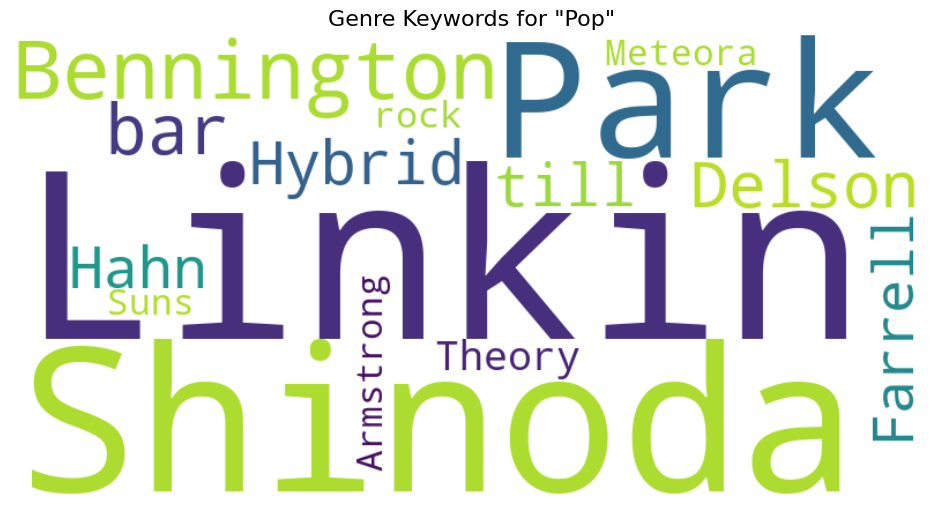


--- TOP 15 TF-IDF WORDS FOR: ALTERNATIVE ROCK ---
  Burnley              0.6127
  Benjamin             0.3715
  Breaking             0.2970
  Rauch                0.1427
  Agony                0.1427
  bar                  0.1245
  Dear                 0.1239
  Hummel               0.1091
  Fink                 0.1091
  Wallen               0.1091
  Klepaski             0.1007
  Bruch                0.0923
  Dark                 0.0846
  Cold                 0.0839
  Foist                0.0839


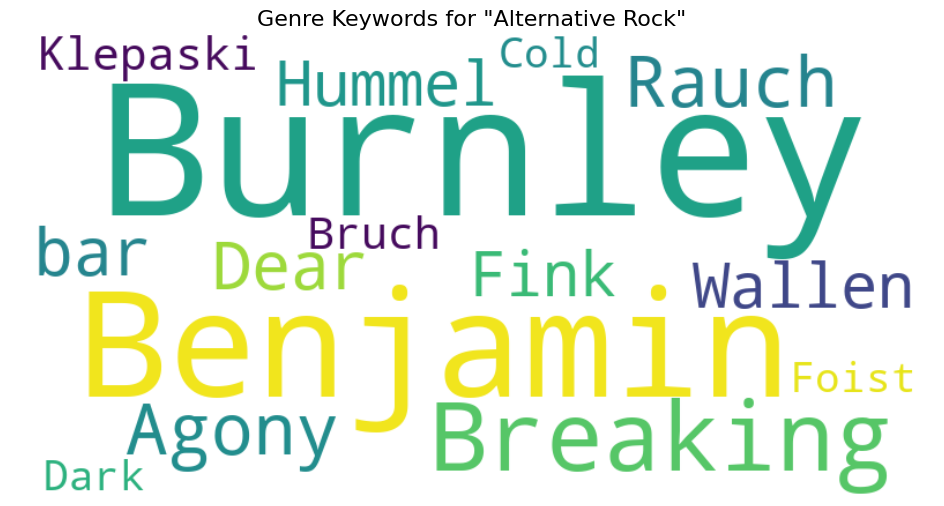


--- TOP 15 TF-IDF WORDS FOR: ROCK AND ROLL ---
  Hollies              0.6547
  Nash                 0.3958
  Clarke               0.2827
  Hicks                0.1885
  Stop                 0.1719
  Elliott              0.1131
  single               0.1010
  Haydock              0.0942
  Graham               0.0876
  group                0.0857
  Tony                 0.0849
  Calvert              0.0848
  Sylvester            0.0754
  Parlophone           0.0754
  Holly                0.0754


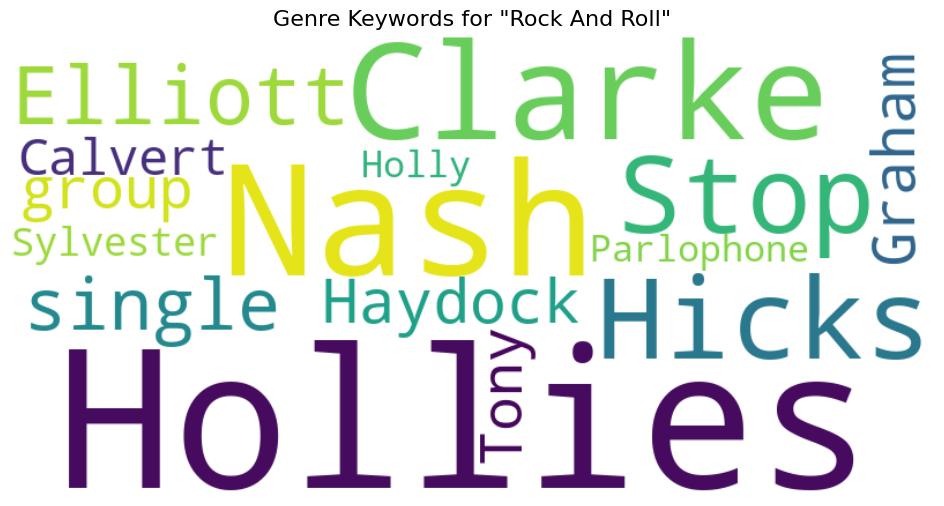


--- TOP 15 TF-IDF WORDS FOR: PUNK ROCK ---
  Police               0.4979
  Sting                0.3843
  Copeland             0.3621
  Summers              0.3132
  Roxanne              0.1272
  Every                0.1160
  Synchronicity        0.1077
  punk                 0.1070
  tour                 0.0988
  Message              0.0979
  Breath               0.0950
  Take                 0.0870
  London               0.0807
  Bottle               0.0786
  Padovani             0.0783


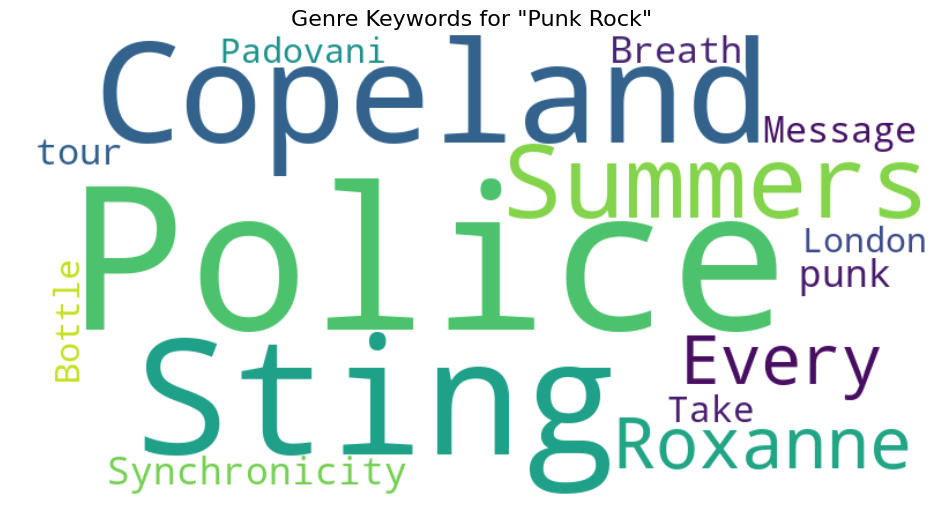


--- TOP 15 TF-IDF WORDS FOR: BLUES ROCK ---
  Yardbirds            0.5543
  Beck                 0.3806
  Page                 0.3175
  McCarty              0.2858
  Dreja                0.2572
  Relf                 0.2001
  Clapton              0.1239
  blues                0.1034
  Idan                 0.0953
  Topham               0.0762
  Zeppelin             0.0735
  John                 0.0728
  guitar               0.0725
  lead                 0.0681
  Samwell              0.0667


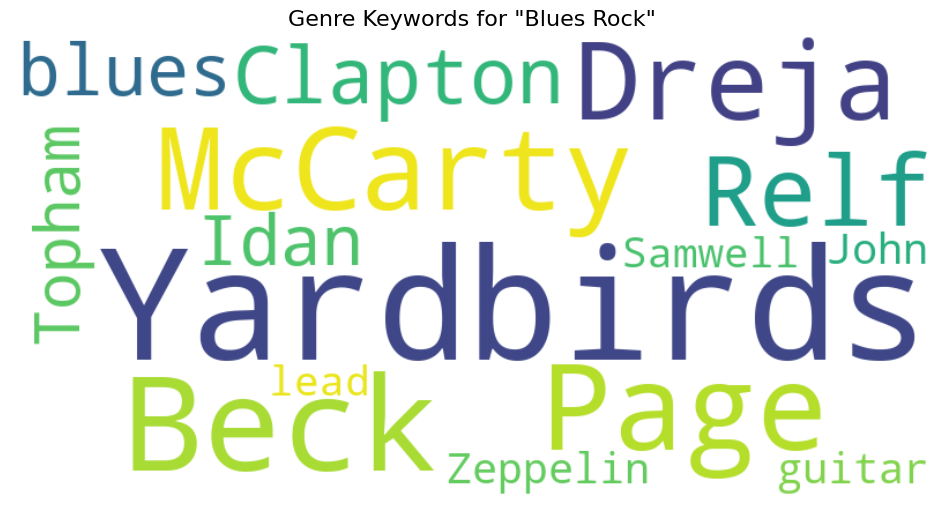


--- TOP 15 TF-IDF WORDS FOR: ALTERNATIVE METAL ---
  bar                  0.5591
  till                 0.3634
  Guitar               0.1837
  Jesse                0.1694
  studio               0.1597
  Brian                0.1502
  Years                0.1502
  Bass                 0.1491
  Matt                 0.1408
  legend               0.1391
  Lewis                0.1289
  Wasteland            0.1129
  Drums                0.1118
  Wantland             0.0988
  Hasek                0.0988


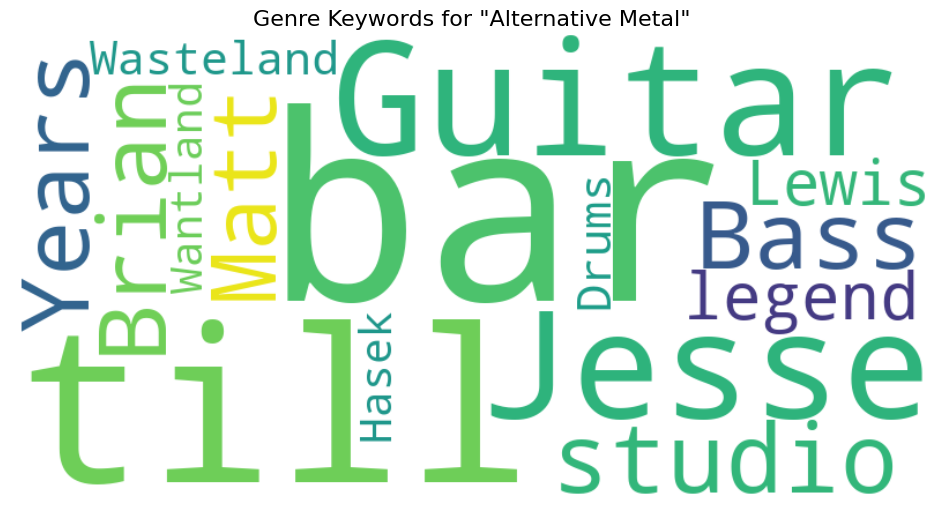


--- TOP 15 TF-IDF WORDS FOR: METAL ---
  bar                  0.5591
  till                 0.3634
  Guitar               0.1837
  Jesse                0.1694
  studio               0.1597
  Brian                0.1502
  Years                0.1502
  Bass                 0.1491
  Matt                 0.1408
  legend               0.1391
  Lewis                0.1289
  Wasteland            0.1129
  Drums                0.1118
  Wantland             0.0988
  Hasek                0.0988


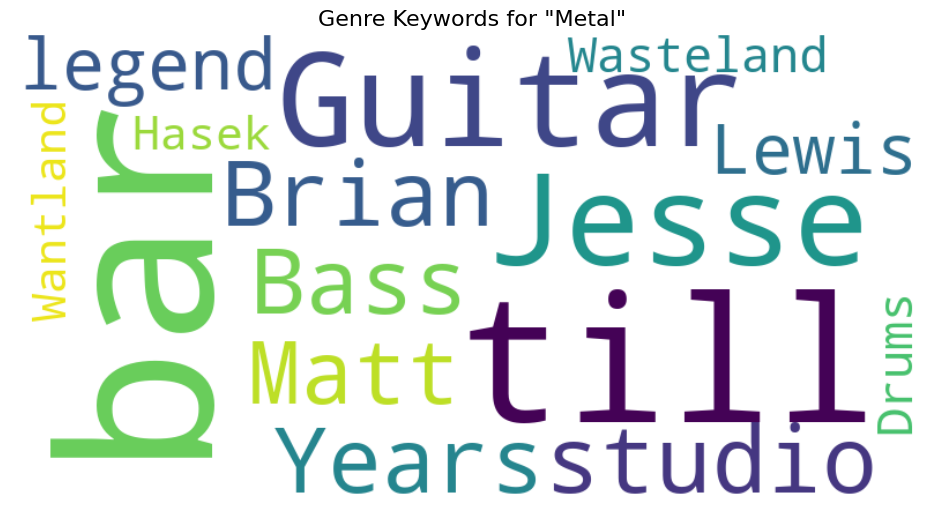


--- TOP 15 TF-IDF WORDS FOR: PROGRESSIVE ROCK ---
  Weiland              0.5663
  STP                  0.2941
  Pilots               0.2351
  Temple               0.2351
  DeLeo                0.2335
  Core                 0.1790
  Bennington           0.1665
  Stone                0.1600
  Kretz                0.1534
  Gutt                 0.1279
  Dean                 0.1138
  bar                  0.1047
  Chester              0.0999
  tour                 0.0913
  Purple               0.0892


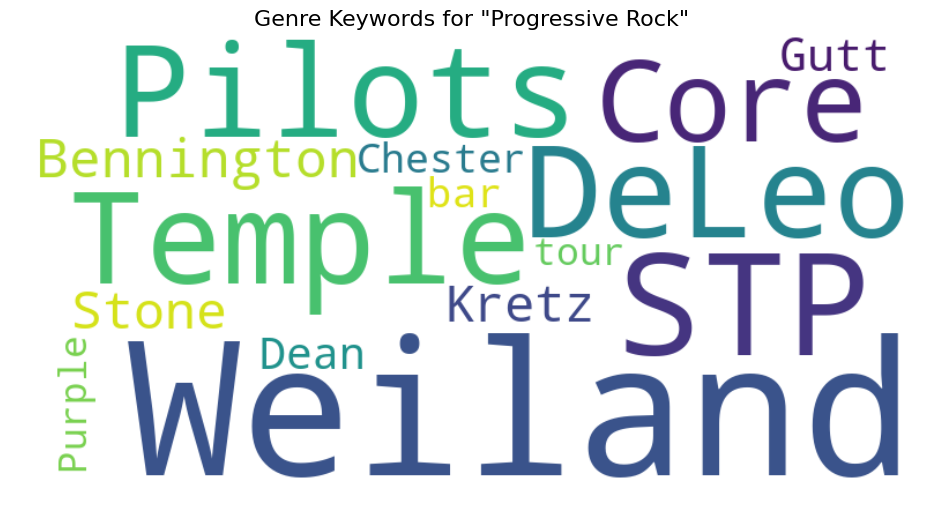


--- TOP 15 TF-IDF WORDS FOR: FOLK ROCK ---
  Simon                0.6870
  Garfunkel            0.5535
  duo                  0.1853
  Columbia             0.0965
  folk                 0.0891
  Troubled             0.0806
  Silence              0.0772
  Bridge               0.0681
  Bookends             0.0659
  Nichols              0.0659
  Paul                 0.0652
  number               0.0643
  Hall                 0.0604
  Water                0.0566
  Fame                 0.0522


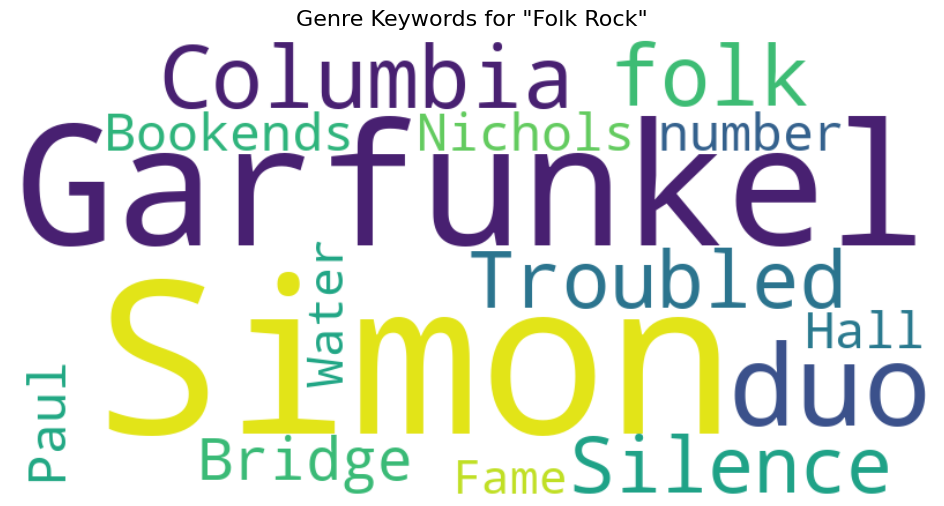


--- TOP 15 TF-IDF WORDS FOR: POST GRUNGE ---
  bar                  0.5591
  till                 0.3634
  Guitar               0.1837
  Jesse                0.1694
  studio               0.1597
  Brian                0.1502
  Years                0.1502
  Bass                 0.1491
  Matt                 0.1408
  legend               0.1391
  Lewis                0.1289
  Wasteland            0.1129
  Drums                0.1118
  Wantland             0.0988
  Hasek                0.0988


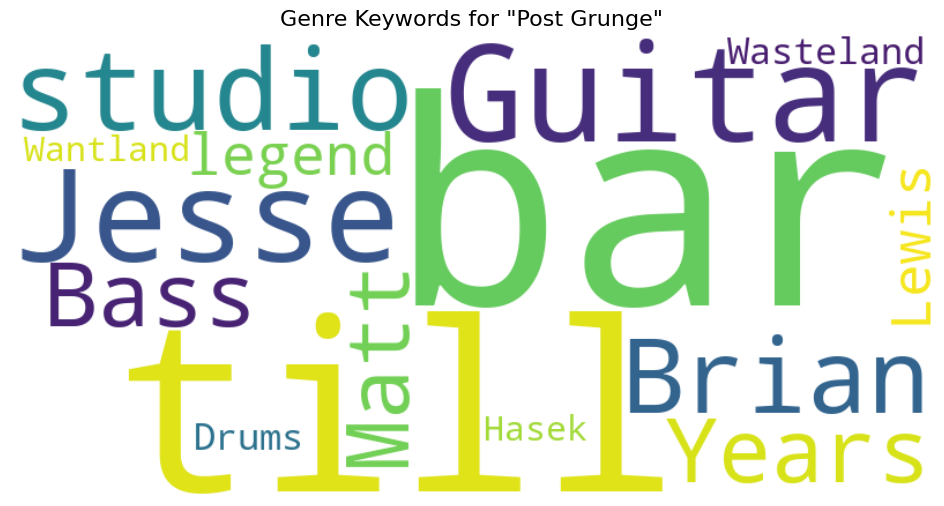


--- TOP 15 TF-IDF WORDS FOR: SOFT ROCK ---
  Gouldman             0.5048
  Stewart              0.3744
  Godley               0.3707
  Creme                0.3076
  Strawberry           0.1503
  Fenn                 0.1323
  Love                 0.1215
  Burgess              0.1018
  single               0.0959
  Katz                 0.0916
  Not                  0.0845
  Lol                  0.0814
  Kevin                0.0715
  Tosh                 0.0713
  members              0.0694


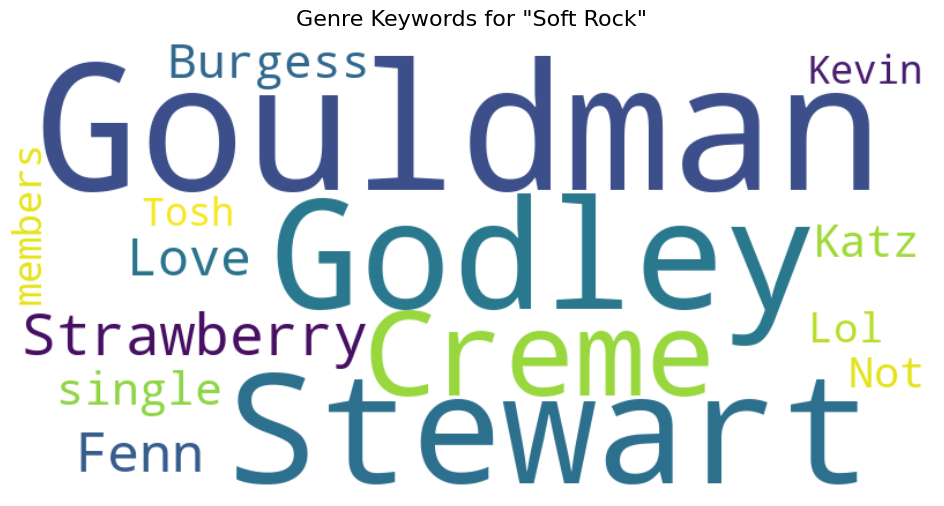


--- TOP 15 TF-IDF WORDS FOR: COUNTRY ROCK ---
  Skynyrd              0.4720
  Zant                 0.3587
  Lynyrd               0.3399
  Van                  0.3304
  Rossington           0.2832
  Collins              0.2077
  Burns                0.1416
  Gaines               0.1322
  Pyle                 0.1227
  Ronnie               0.1148
  Wilkeson             0.1133
  Powell               0.1038
  crash                0.0878
  Tour                 0.0869
  King                 0.0830


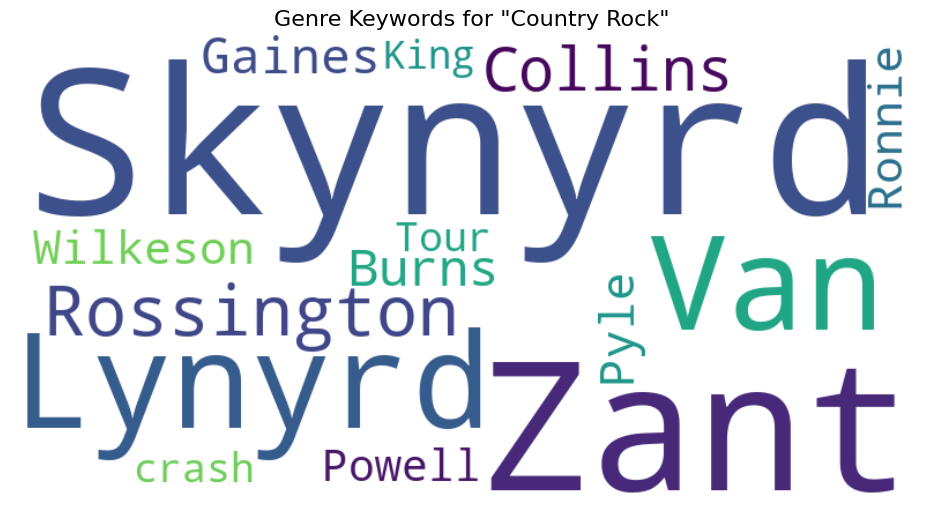


--- TOP 15 TF-IDF WORDS FOR: NEW WAVE ---
  Police               0.4979
  Sting                0.3843
  Copeland             0.3621
  Summers              0.3132
  Roxanne              0.1272
  Every                0.1160
  Synchronicity        0.1077
  punk                 0.1070
  tour                 0.0988
  Message              0.0979
  Breath               0.0950
  Take                 0.0870
  London               0.0807
  Bottle               0.0786
  Padovani             0.0783


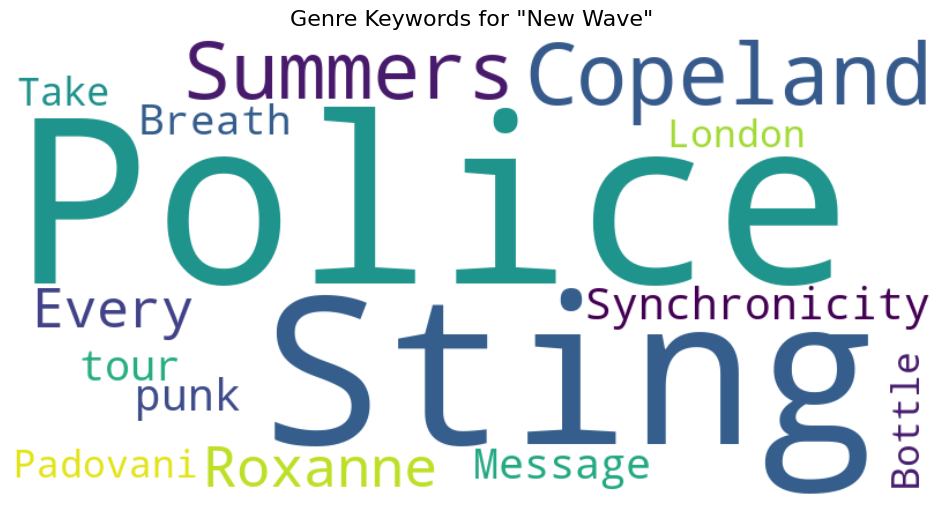


--- TOP 15 TF-IDF WORDS FOR: ART ROCK ---
  Moreno               0.4613
  Deftones             0.3440
  Cheng                0.3145
  Carpenter            0.2621
  Cunningham           0.2307
  metal                0.1602
  Vega                 0.1573
  Eros                 0.1363
  Pony                 0.1258
  bar                  0.1180
  Delgado              0.1153
  Chi                  0.1048
  White                0.0975
  Date                 0.0944
  Garcia               0.0944


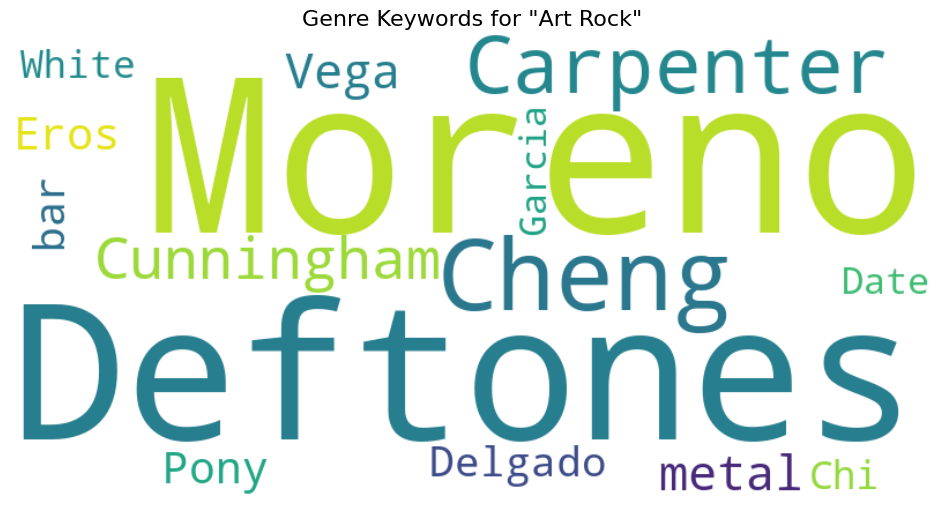



           ANALYZING TF-IDF FOR COMMUNITIES

--- TOP 15 TF-IDF WORDS FOR: C0 ---
  bar                  0.5080
  till                 0.2942
  Abel                 0.2808
  Jared                0.2592
  Saving               0.2160
  Weeks                0.1855
  Jason                0.1855
  Scott                0.1734
  Scotty               0.1728
  Null                 0.1728
  Steven               0.1324
  Blake                0.1311
  Daniel               0.1296
  Bartlett             0.1296
  Eric                 0.1177


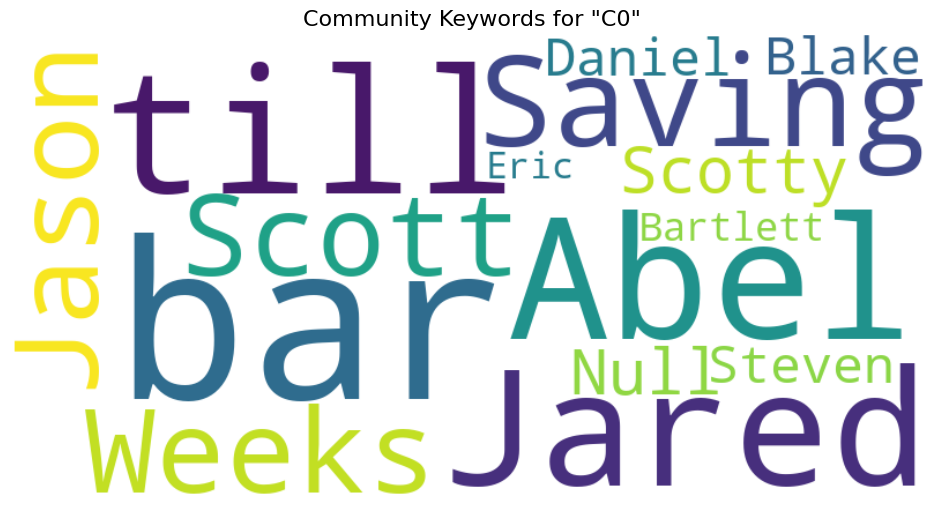


--- TOP 15 TF-IDF WORDS FOR: C1 ---
  Cream                0.5219
  Clapton              0.4987
  Baker                0.4083
  Bruce                0.3238
  Ginger               0.0996
  Disraeli             0.0928
  Gears                0.0928
  blues                0.0840
  Wheels               0.0812
  rock                 0.0767
  Albert               0.0704
  Bond                 0.0697
  trio                 0.0598
  farewell             0.0598
  Jack                 0.0588


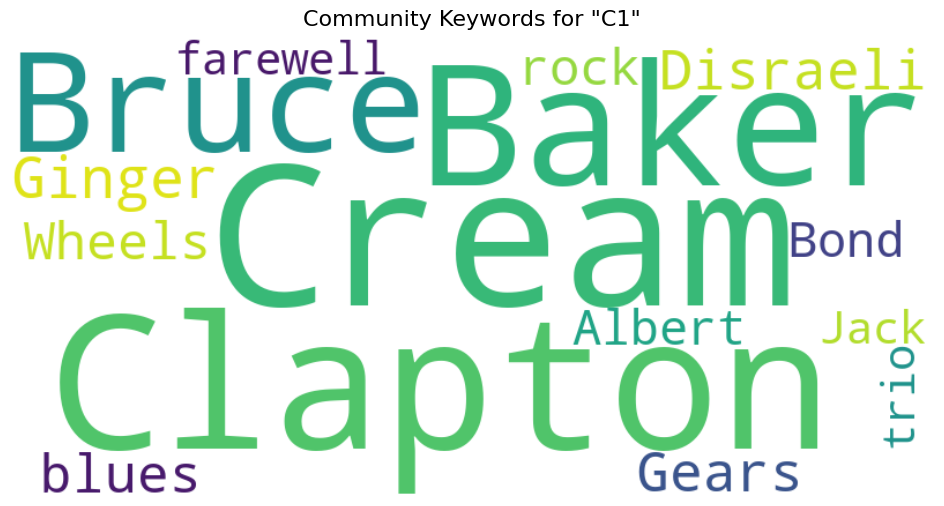


--- TOP 15 TF-IDF WORDS FOR: C2 ---
  Pantera              0.5470
  Anselmo              0.5242
  metal                0.1957
  bar                  0.1796
  Vinnie               0.1747
  Darrell              0.1694
  Dimebag              0.1296
  Metal                0.1210
  Abbott               0.1184
  till                 0.1151
  Rex                  0.1127
  Power                0.1071
  Hell                 0.0968
  Brown                0.0959
  Cowboys              0.0823


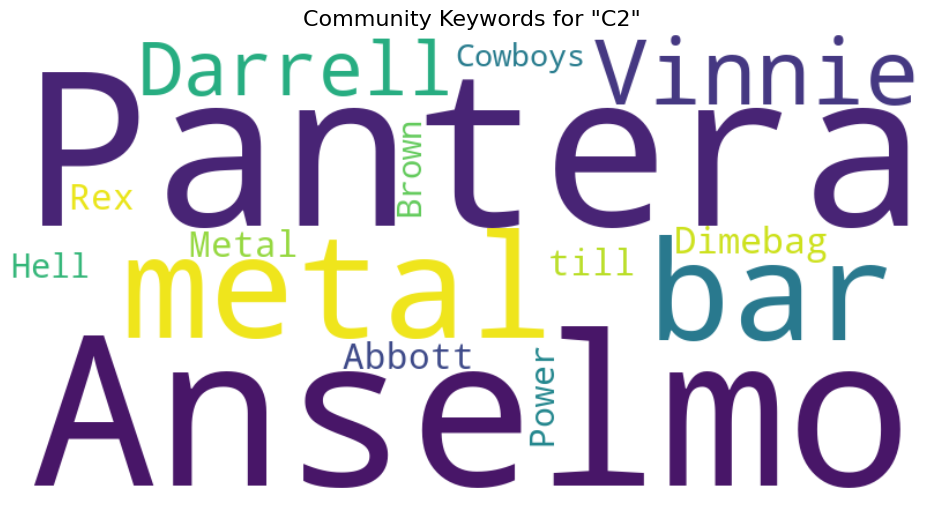


--- TOP 15 TF-IDF WORDS FOR: C3 ---
  Morrison             0.6762
  Doors                0.5037
  Manzarek             0.2967
  Krieger              0.1656
  Densmore             0.1449
  bass                 0.0757
  Strange              0.0564
  Hotel                0.0552
  group                0.0529
  Ray                  0.0511
  Elektra              0.0483
  vocals               0.0481
  Woman                0.0474
  rock                 0.0456
  Jim                  0.0426


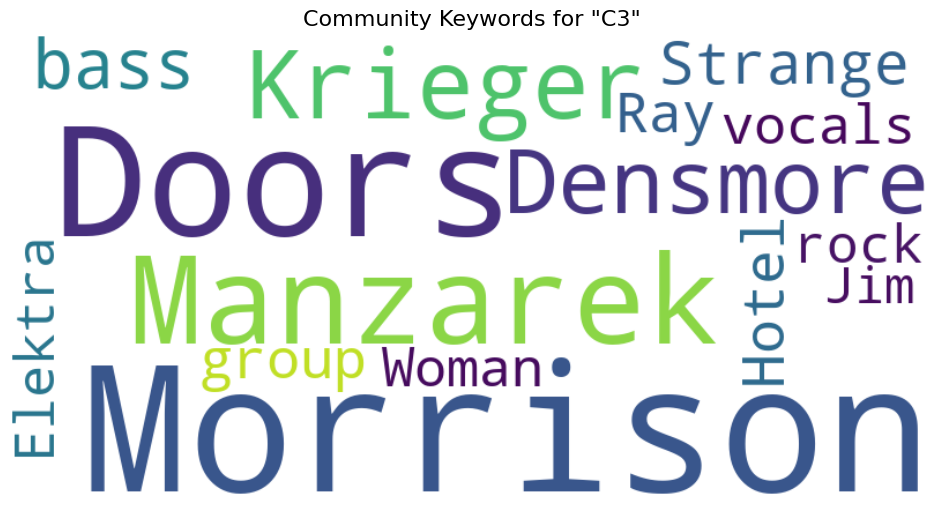


--- TOP 15 TF-IDF WORDS FOR: C4 ---
  Kinks                0.5623
  Davies               0.5623
  Ray                  0.2499
  Avory                0.1607
  Quaife               0.1369
  Dave                 0.1201
  group                0.0995
  Preservation         0.0818
  Dalton               0.0774
  number               0.0750
  single               0.0705
  rock                 0.0684
  Village              0.0613
  Green                0.0608
  chart                0.0602


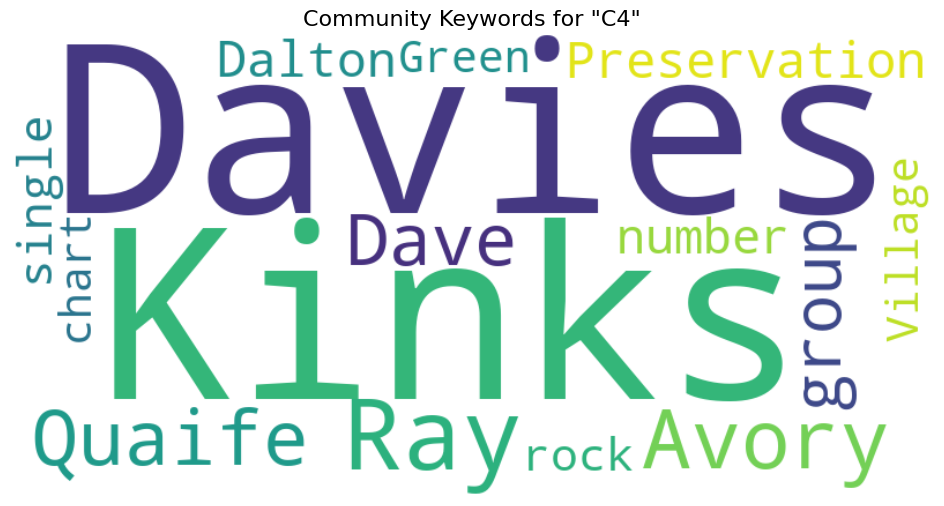


--- TOP 15 TF-IDF WORDS FOR: C5 ---
  Chemical             0.3426
  Romance              0.3426
  Way                  0.2862
  Parade               0.2682
  Gerard               0.2519
  Black                0.1931
  Iero                 0.1612
  emo                  0.1511
  rock                 0.1473
  bar                  0.1452
  Bryar                0.1310
  tour                 0.1250
  punk                 0.1244
  Mikey                0.1209
  Brought              0.1008


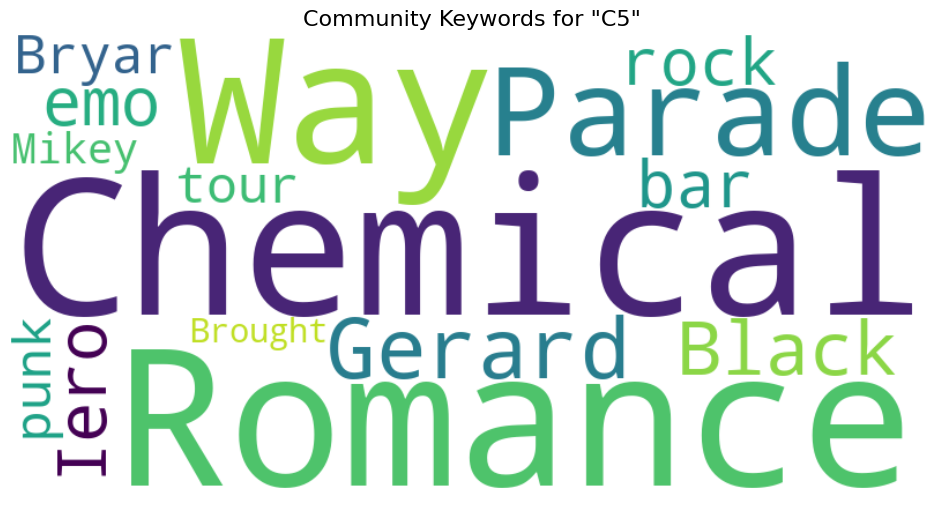


--- TOP 15 TF-IDF WORDS FOR: C6 ---
  Parsons              0.6770
  Woolfson             0.4166
  Project              0.3556
  Alan                 0.2502
  vocals               0.1390
  Freudiana            0.0868
  Eye                  0.0745
  Poe                  0.0694
  Mystery              0.0694
  Pilot                0.0694
  Paton                0.0694
  Imagination          0.0694
  Stuart               0.0694
  Sky                  0.0591
  saxophone            0.0591


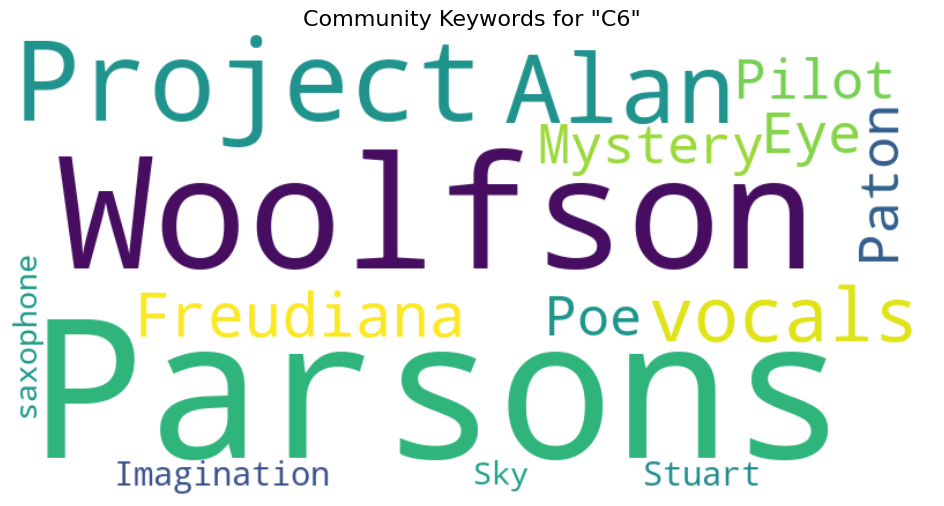


--- TOP 15 TF-IDF WORDS FOR: C7 ---
  Dury                 0.8731
  Blockheads           0.2183
  Ian                  0.1348
  Jankel               0.1201
  London               0.0931
  Vincent              0.0873
  His                  0.0743
  Upminster            0.0655
  Kilburn              0.0655
  Roads                0.0655
  Art                  0.0580
  Reasons              0.0546
  Cheerful             0.0546
  Peggy                0.0546
  College              0.0497


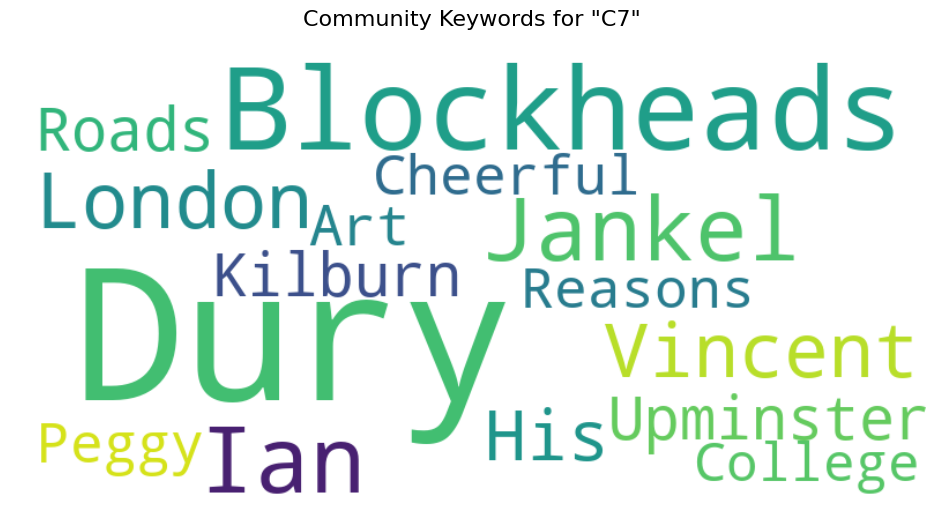


--- TOP 15 TF-IDF WORDS FOR: C8 ---
  Murphey              0.8031
  Cowboy               0.3614
  cowboy               0.1927
  Western              0.1477
  Texas                0.1035
  National             0.0723
  Christmas            0.0711
  Songs                0.0679
  Michael              0.0665
  Lauren               0.0642
  Wildfire             0.0642
  Country              0.0609
  Award                0.0582
  country              0.0574
  Grass                0.0562


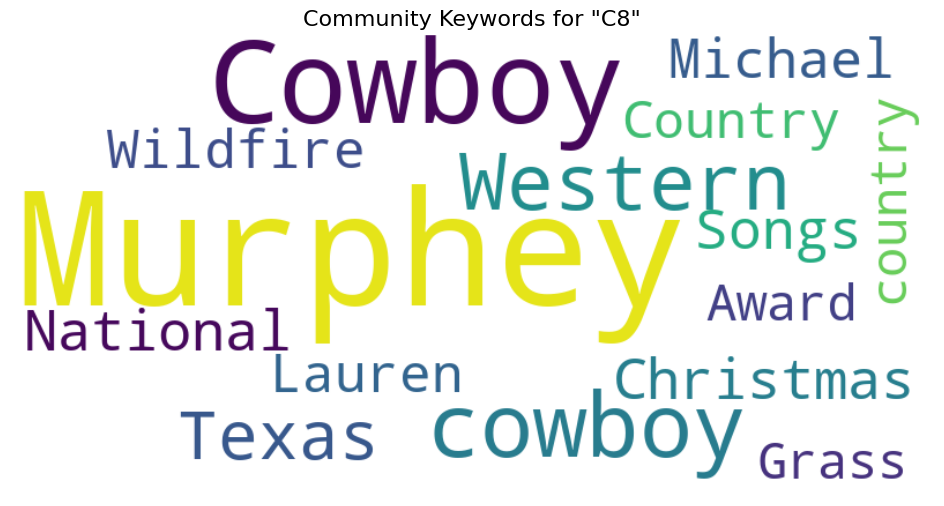


--- TOP 15 TF-IDF WORDS FOR: C9 ---
  Roses                0.4668
  Squire               0.3745
  Brown                0.3370
  Stone                0.2587
  Manchester           0.1953
  Mani                 0.1873
  Reni                 0.1471
  Ian                  0.1156
  June                 0.0978
  Silvertone           0.0936
  Garner               0.0936
  Couzens              0.0936
  John                 0.0924
  gigs                 0.0911
  time                 0.0805


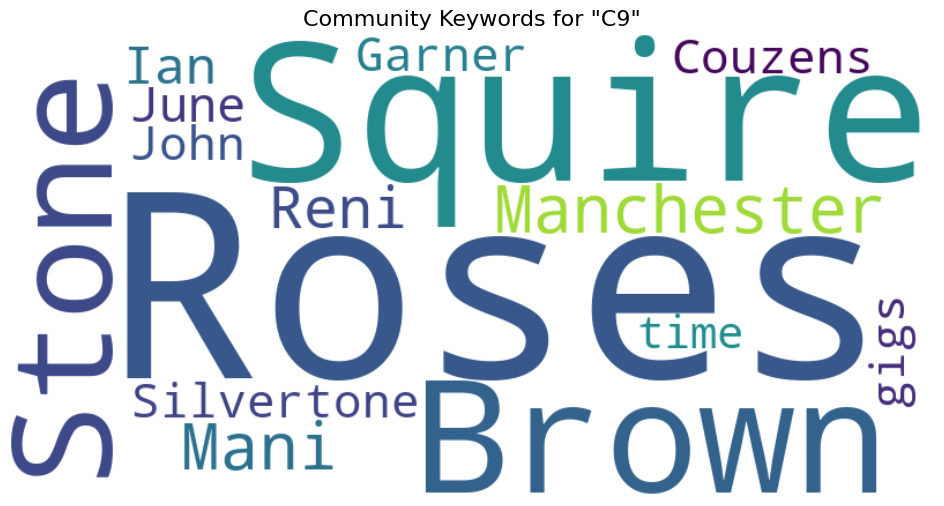


--- TOP 15 TF-IDF WORDS FOR: C10 ---
  Aerosmith            0.6009
  Tyler                0.4533
  Perry                0.3402
  tour                 0.1390
  Whitford             0.1232
  Joe                  0.1169
  Kramer               0.0968
  Rock                 0.0841
  Pump                 0.0836
  Steven               0.0809
  Hamilton             0.0756
  number               0.0697
  Tour                 0.0683
  Boston               0.0680
  Walk                 0.0668


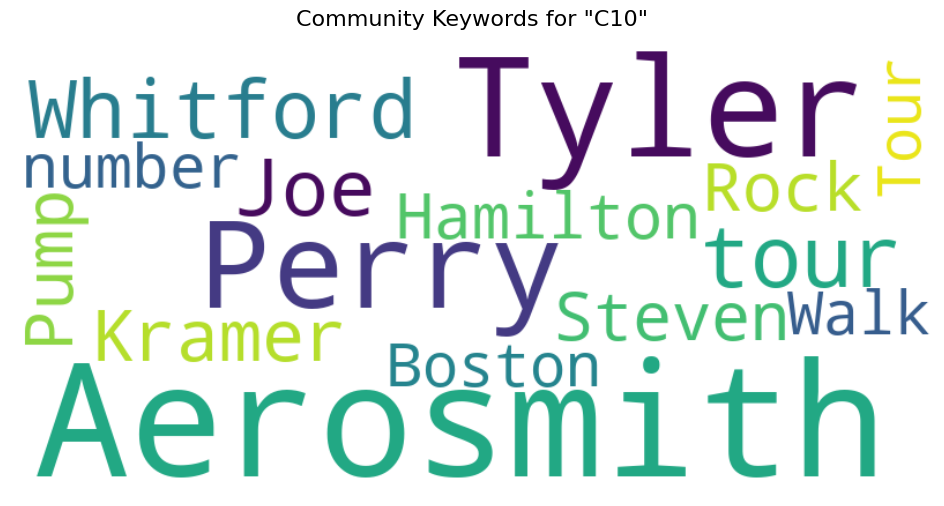


--- TOP 15 TF-IDF WORDS FOR: C11 ---
  Radiohead            0.8232
  Yorke                0.2983
  Greenwood            0.2201
  Jonny                0.1467
  Kid                  0.0965
  Godrich              0.0783
  Computer             0.0783
  Rainbows             0.0783
  EMI                  0.0756
  Selway               0.0734
  Limbs                0.0636
  Brien                0.0599
  Creep                0.0587
  Hail                 0.0587
  Thief                0.0504


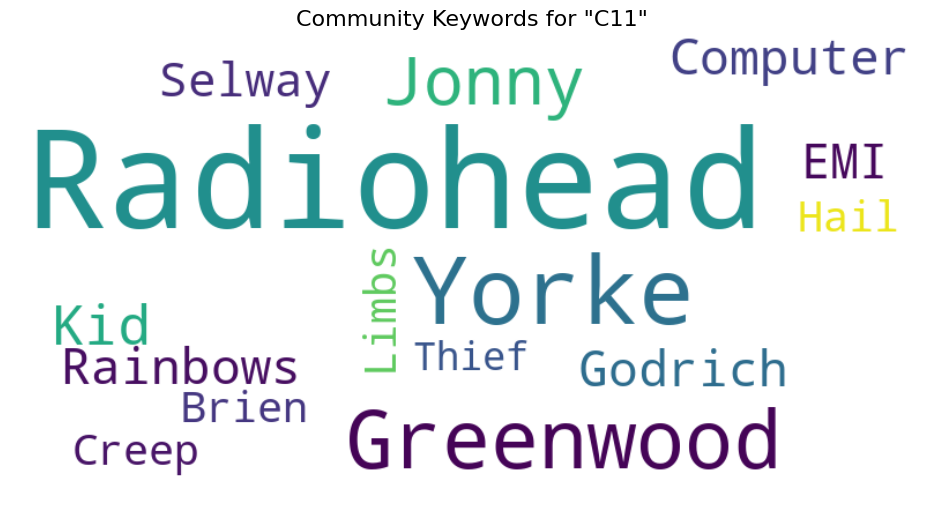

In [21]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# ==============================================================================
# PART 1: AGGREGATE TEXTS FOR COMMUNITIES
# ==============================================================================
print("1. Aggregating texts for the 4 detected communities...")

community_documents = {f'C{i}': [] for i in range(len(louvain_partition))}

for i, community_set in enumerate(louvain_partition):
    for artist in community_set:
        file_path = os.path.join(data_dir, f"{artist}.txt")
        if os.path.exists(file_path):
            with open(file_path, 'r', encoding='utf-8') as f:
                text = f.read()
            community_documents[f'C{i}'].append(text)

# Join the lists of texts into one long string per community
for comm_id, texts in community_documents.items():
    community_documents[comm_id] = " ".join(texts)

print("  -> Community text aggregation complete.")


# ==============================================================================
# PART 2: A REUSABLE FUNCTION TO CALCULATE & VISUALIZE TF-IDF
# ==============================================================================

def calculate_and_visualize_tfidf(documents_dict, title_prefix=""):
    """
    Takes a dictionary of documents (name: text), calculates TF-IDF,
    prints the top words, and generates word clouds.
    """
    
    # Use scikit-learn's TfidfVectorizer. We pass our custom stopwords.
    # We also use the advanced cleaner from before.
    vectorizer = TfidfVectorizer(
        preprocessor=advanced_wikitext_cleaner,
        stop_words=list(stop_words),
        token_pattern=r'[a-zA-Z]{3,}', # Extracts words of 3+ letters
        max_features=2000 # Limit the vocabulary size
    )
    
    # Create the TF-IDF matrix
    tfidf_matrix = vectorizer.fit_transform(documents_dict.values())
    
    # Get the vocabulary (the words themselves)
    feature_names = vectorizer.get_feature_names_out()
    
    # Get the document names (e.g., 'hard rock' or 'C0')
    doc_names = list(documents_dict.keys())
    
    # Iterate through each document to find and display its top words
    for i, doc_name in enumerate(doc_names):
        print(f"\n--- TOP 15 TF-IDF WORDS FOR: {doc_name.upper()} ---")
        
        # Get the TF-IDF scores for this document
        doc_scores = tfidf_matrix[i].toarray().flatten()
        
        # Get the indices of the top 15 scores
        top_indices = doc_scores.argsort()[-15:][::-1]
        
        # Create a dictionary of {word: score} for the word cloud
        top_words_scores = {feature_names[j]: doc_scores[j] for j in top_indices}
        
        for word, score in top_words_scores.items():
            print(f"  {word:<20} {score:.4f}")

        # --- Generate Word Cloud ---
        wc = WordCloud(
            width=800, height=400, background_color='white', colormap='viridis'
        ).generate_from_frequencies(top_words_scores)
        
        plt.figure(figsize=(12, 6))
        plt.imshow(wc, interpolation='bilinear')
        plt.title(f'{title_prefix}Keywords for "{doc_name.title()}"', fontsize=16)
        plt.axis('off')
        plt.show()

# ==============================================================================
# PART 3: RUN THE ANALYSIS FOR GENRES AND COMMUNITIES
# ==============================================================================

print("\n\n" + "="*50)
print("             ANALYZING TF-IDF FOR GENRES")
print("="*50)
calculate_and_visualize_tfidf(genre_documents, title_prefix="Genre ")

print("\n\n" + "="*50)
print("           ANALYZING TF-IDF FOR COMMUNITIES")
print("="*50)
calculate_and_visualize_tfidf(community_documents, title_prefix="Community ")

# Part 4: Sentiment of the artists and communities

The questions below are based on Lecture 8

* Calculate the sentiment of the band/artist pages (it is OK to work with the sub-network of artists-with-genre) and describe your findings using stats and visualization, inspired by the first exercise of week 8.


Answer:

The overall mean sentiment is 5.6885, with a median of 5.6915. The 25th percentile is 5.6483 and the 75th percentile is 5.7311, showing that most artists fall into a fairly narrow sentiment range.

The histogram shows a roughly normal distribution of sentiment scores, centered around the mean and median. Only a few artists have notably higher or lower sentiment. Overall, the sentiment differences across individual artists are small but noticeable.

Loaded 10222 LabMT words.

Processing files from 'rock_artists_pages'...
Working with G_genres network: 481 nodes

✓ Computed sentiment for 481 pages.
📊 SENTIMENT SUMMARY STATISTICS
  Mean:               5.6885
  Median:             5.6915
  Variance:           0.0041
  Standard Deviation: 0.0638
  25th Percentile:    5.6483
  75th Percentile:    5.7311
  Min:                5.4492
  Max:                5.9262

✓ Histogram saved as 'sentiment_histogram.png'



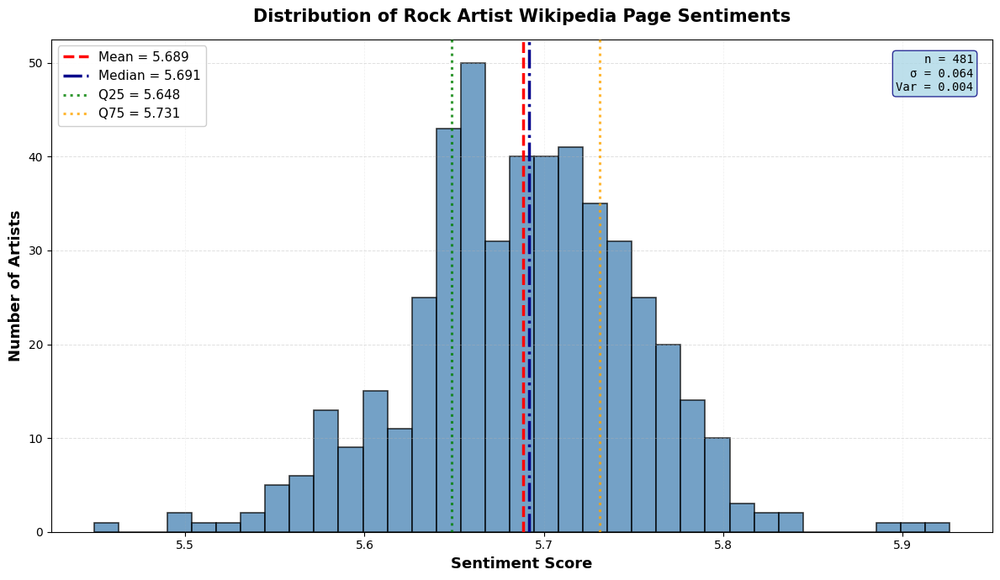

😢 TOP 10 SADDEST ARTISTS (Lowest Sentiment)
   1. Five_Finger_Death_Punch                  5.4492
   2. Canned_Heat                              5.4927
   3. Rob_Zombie                               5.4985
   4. Rage_Against_the_Machine                 5.5089
   5. White_Zombie_(band)                      5.5253
   6. Bad_Company                              5.5333
   7. Bill_Haley_&_His_Comets                  5.5363
   8. Quiet_Riot                               5.5472
   9. Ted_Nugent                               5.5502
  10. Third_Eye_Blind                          5.5512

😄 TOP 10 HAPPIEST ARTISTS (Highest Sentiment)
   1. Tracy_Chapman                            5.9262
   2. Lenny_Kravitz                            5.9047
   3. Boys_Like_Girls                          5.8885
   4. Fun_(band)                               5.8373
   5. Imagine_Dragons                          5.8365
   6. Living_Colour                            5.8249
   7. Coldplay                               

In [22]:
import os
import csv
import numpy as np
import matplotlib.pyplot as plt
import re

# ----------------------------------------------------------
# 1. Load LabMT wordlist
# ----------------------------------------------------------
def load_labmt(filepath):
    """Load LabMT 1.0 word list into a dict: {word: happiness_average}"""
    labmt = {}
    with open(filepath, encoding="utf-8") as f:
        reader = csv.DictReader(f, delimiter='\t')
        for row in reader:
            word = row["word"].strip().lower()
            try:
                score = float(row["happiness_average"])
                labmt[word] = score
            except (ValueError, KeyError):
                continue
    return labmt

labmt_dict = load_labmt("LabMT.txt")
print(f"Loaded {len(labmt_dict)} LabMT words.\n")


# ----------------------------------------------------------
# 2. Sentiment function
# ----------------------------------------------------------
def sentiment(tokens, labmt_dict):
    """
    Calculate average LabMT sentiment for a list of tokens.
    
    Args:
        tokens: List of lowercase word tokens
        labmt_dict: Dictionary mapping words to sentiment scores
    
    Returns:
        Average sentiment score, or None if no words found
    """
    scores = [labmt_dict[w] for w in tokens if w in labmt_dict]
    return np.mean(scores) if scores else None


# ----------------------------------------------------------
# 3. Improved tokenization function
# ----------------------------------------------------------
def tokenize(text):
    """
    Tokenize text into lowercase words.
    - Converts to lowercase
    - Extracts alphabetic words (3+ characters for better quality)
    - Returns list of tokens
    """
    text = text.lower()
    # Extract words that are at least 3 characters long
    tokens = re.findall(r'[a-z]{3,}', text)
    return tokens


# ----------------------------------------------------------
# 4. Process all artist pages and add to network
# ----------------------------------------------------------
folder = "rock_artists_pages"
results = {}
processed = 0
skipped = 0

print(f"Processing files from '{folder}'...")
print(f"Working with G_genres network: {G_genres.number_of_nodes()} nodes\n")

# Iterate over nodes in G_genres network
for node in G_genres.nodes():
    filename = f"{node}.txt"
    path = os.path.join(folder, filename)
    
    # Check if file exists
    if not os.path.exists(path):
        skipped += 1
        continue
    
    try:
        with open(path, encoding="utf-8") as f:
            text = f.read()
        
        tokens = tokenize(text)
        score = sentiment(tokens, labmt_dict)
        
        if score is not None:
            # Add sentiment as a node attribute to G_genres
            G_genres.nodes[node]['sentiment'] = score
            results[node] = score
            processed += 1
        else:
            skipped += 1
    except Exception as e:
        print(f"Error processing {node}: {e}")
        skipped += 1

print(f"✓ Computed sentiment for {processed} pages.")
if skipped > 0:
    print(f"⚠ Skipped {skipped} pages (file not found, no sentiment words, or errors).\n")


# ----------------------------------------------------------
# 5. Summary statistics
# ----------------------------------------------------------
sentiments = list(results.values())

if not sentiments:
    raise ValueError("No sentiment scores computed! Check your data files.")

mean_sent = np.mean(sentiments)
median_sent = np.median(sentiments)
variance_sent = np.var(sentiments)
std_sent = np.std(sentiments)
q25, q75 = np.percentile(sentiments, [25, 75])

print("=" * 60)
print("📊 SENTIMENT SUMMARY STATISTICS")
print("=" * 60)
print(f"  Mean:               {mean_sent:.4f}")
print(f"  Median:             {median_sent:.4f}")
print(f"  Variance:           {variance_sent:.4f}")
print(f"  Standard Deviation: {std_sent:.4f}")
print(f"  25th Percentile:    {q25:.4f}")
print(f"  75th Percentile:    {q75:.4f}")
print(f"  Min:                {min(sentiments):.4f}")
print(f"  Max:                {max(sentiments):.4f}")
print("=" * 60 + "\n")


# ----------------------------------------------------------
# 6. Enhanced histogram (using Week 2 skills!)
# ----------------------------------------------------------
plt.figure(figsize=(12, 7))

# Create histogram
counts, bins, patches = plt.hist(sentiments, bins=35, edgecolor='black', 
                                  alpha=0.75, color='steelblue', linewidth=1.2)

# Add vertical lines for statistics
plt.axvline(mean_sent, color='red', linestyle='--', linewidth=2.5, 
            label=f'Mean = {mean_sent:.3f}', zorder=5)
plt.axvline(median_sent, color='darkblue', linestyle='-.', linewidth=2.5, 
            label=f'Median = {median_sent:.3f}', zorder=5)
plt.axvline(q25, color='green', linestyle=':', linewidth=2.2, 
            alpha=0.8, label=f'Q25 = {q25:.3f}', zorder=5)
plt.axvline(q75, color='orange', linestyle=':', linewidth=2.2, 
            alpha=0.8, label=f'Q75 = {q75:.3f}', zorder=5)

# Styling
plt.xlabel("Sentiment Score", fontsize=13, fontweight='bold')
plt.ylabel("Number of Artists", fontsize=13, fontweight='bold')
plt.title("Distribution of Rock Artist Wikipedia Page Sentiments", 
          fontsize=15, fontweight='bold', pad=15)
plt.legend(fontsize=11, loc='upper left', framealpha=0.95)
plt.grid(axis='y', alpha=0.4, linestyle='--', linewidth=0.7)
plt.grid(axis='x', alpha=0.2, linestyle='--', linewidth=0.5)

# Add text box with additional stats
stats_text = f'n = {len(sentiments)}\nσ = {std_sent:.3f}\nVar = {variance_sent:.3f}'
props = dict(boxstyle='round', facecolor='lightblue', alpha=0.8, edgecolor='navy')
plt.text(0.98, 0.97, stats_text, transform=plt.gca().transAxes, 
         fontsize=10, verticalalignment='top', horizontalalignment='right', 
         bbox=props, family='monospace')

plt.tight_layout()
plt.savefig('sentiment_histogram.png', dpi=300, bbox_inches='tight')
print("✓ Histogram saved as 'sentiment_histogram.png'\n")
plt.show()


# ----------------------------------------------------------
# 7. Happiest and Saddest artists (Top 10)
# ----------------------------------------------------------
sorted_artists = sorted(results.items(), key=lambda x: x[1])
saddest = sorted_artists[:10]
happiest = sorted_artists[-10:]

print("=" * 60)
print("😢 TOP 10 SADDEST ARTISTS (Lowest Sentiment)")
print("=" * 60)
for i, (name, score) in enumerate(saddest, 1):
    print(f"  {i:2d}. {name:40s} {score:.4f}")

print("\n" + "=" * 60)
print("😄 TOP 10 HAPPIEST ARTISTS (Highest Sentiment)")
print("=" * 60)
for i, (name, score) in enumerate(reversed(happiest), 1):
    print(f"  {i:2d}. {name:40s} {score:.4f}")
print("=" * 60)


# ----------------------------------------------------------
# 8. Optional: Save detailed results
# ----------------------------------------------------------
with open('sentiment_results.csv', 'w', encoding='utf-8', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['Artist', 'Sentiment_Score'])
    for artist, score in sorted(results.items(), key=lambda x: x[1], reverse=True):
        writer.writerow([artist, f"{score:.6f}"])

print(f"\n✓ Full results saved to 'sentiment_results.csv' ({len(results)} artists)")
print(f"✓ Sentiment added as node attribute to G_genres network")

* Discuss the sentiment of the communities.

Answer:

The community sentiment scores are pretty close overall, ranging only from 5.65 to 5.71, meaning most rock subgenres share a similar emotional tone. Still, there are small but clear trends. The happiest groups (C2, C9, and C3) are centered on artists such as U2, David Bowie, and Coldplay, they are mostly alternative and pop-influenced rock, which often has more positive .

On the other hand, the lowest-scoring ones (C7, C5, and C6) are dominated by heavier styles like metal and blues rock, with artists such as Metallica, Aerosmith, and Clapton, whose lyrics tend to explore darker or more emotional themes.

The coefficient of variation shows that communities are slightly less variable than the network overall: 0.0036 for communities vs 0.0112 overall. This means that sentiment is fairly consistent across the network, though some communities stand out a bit.

* Do the findings using TF-IDF during Lecture 7 help you understand your results?

Answer:

Yes, the TF-IDF results help explain the sentiment scores we found for each community. By highlight the main artists and themes that define each community and it helps to understand the mood differences.

For example, the TF-IDF terms for happier groups include artists like Coldplay and U2, whose music often feels more positive. In contrast, lower-sentiment communities feature names like Led Zeppelin which known for heavier, darker sounds. So the TF-IDF keywords give good context for why some communities feel more positive while others lean more negative.

Detecting communities using Louvain algorithm...
Found 12 communities

TOP 10 LARGEST COMMUNITIES
Community  0:   84 artists
Community  1:   68 artists
Community  2:   66 artists
Community  3:   54 artists
Community  4:   51 artists
Community  5:   43 artists
Community  6:   40 artists
Community  7:   36 artists
Community  8:   18 artists
Community  9:    9 artists

Calculating community-level sentiments...

COMMUNITY SENTIMENT SUMMARY (sorted by sentiment)

Community  2 (n=  66, sentiment_n=  66)
  Avg Sentiment: 5.7140 (σ = 0.0545)
  Top 3 Artists: U2, David_Bowie, Coldplay
  Top 3 Genres:  alternative rock, pop, punk rock

Community  9 (n=   9, sentiment_n=   9)
  Avg Sentiment: 5.7108 (σ = 0.0894)
  Top 3 Artists: Audioslave, Led_Zeppelin, Chris_Cornell
  Top 3 Genres:  alternative rock, pop, hard rock

Community  3 (n=  54, sentiment_n=  54)
  Avg Sentiment: 5.7022 (σ = 0.0537)
  Top 3 Artists: Breaking_Benjamin, Three_Days_Grace, Shinedown
  Top 3 Genres:  hard rock, alternative 

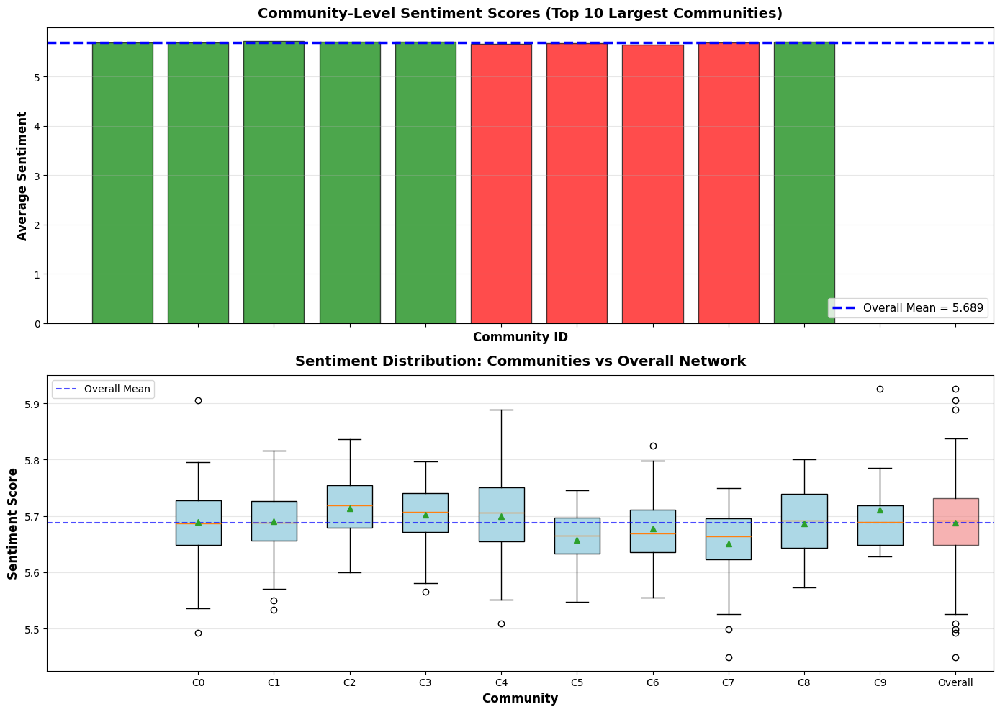

STATISTICAL COMPARISON
Coefficient of Variation (communities): 0.0036
Coefficient of Variation (overall):     0.0112

One-sample t-tests (community vs overall mean):
  Community  2: t= 3.770, p=0.0004 ***
  Community  9: t= 0.705, p=0.5005 
  Community  3: t= 1.859, p=0.0686 
  Community  4: t= 1.053, p=0.2976 
  Community  1: t= 0.267, p=0.7902 
  Community  0: t= 0.046, p=0.9635 
  Community  8: t=-0.103, p=0.9189 
  Community  6: t=-1.137, p=0.2623 
  Community  5: t=-3.796, p=0.0005 ***
  Community  7: t=-3.246, p=0.0026 **

✓ Results saved to 'community_sentiment_results.csv'


In [24]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter, defaultdict
import pandas as pd
from scipy import stats

# ----------------------------------------------------------
# 1. Detect communities using Louvain algorithm
# ----------------------------------------------------------
print("Detecting communities using Louvain algorithm...")
# Assuming G_genres is your graph object and artist_genres is your dictionary
communities = nx.community.louvain_communities(G_genres, seed=77,resolution=1.5)
print(f"Found {len(communities)} communities\n")

# ----------------------------------------------------------
# 2. Get the 10 largest communities
# ----------------------------------------------------------
# Sort communities by size
communities_sorted = sorted(communities, key=len, reverse=True)
top_10_communities = communities_sorted[:10]

print("=" * 70)
print("TOP 10 LARGEST COMMUNITIES")
print("=" * 70)
# CHANGED: Enumerate from 0 for community IDs
for comm_idx, comm in enumerate(top_10_communities):
    print(f"Community {comm_idx:2d}: {len(comm):4d} artists")
print("=" * 70 + "\n")


# ----------------------------------------------------------
# 3. Calculate sentiment for each community
# ----------------------------------------------------------
print("Calculating community-level sentiments...\n")

community_data = []

# CHANGED: Enumerate from the default of 0
for comm_idx, community in enumerate(top_10_communities):
    # Get sentiment scores for nodes in this community
    sentiments = []
    for node in community:
        if 'sentiment' in G_genres.nodes[node]:
            sentiments.append(G_genres.nodes[node]['sentiment'])
    
    if sentiments:
        avg_sentiment = np.mean(sentiments)
        std_sentiment = np.std(sentiments)
        
        # Get the three most connected artists in this community
        subgraph = G_genres.subgraph(community)
        degrees = dict(subgraph.degree())
        top_3_artists = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:3]
        top_3_names = [artist for artist, deg in top_3_artists]
        
        # Get genre distribution for this community
        genre_counter = Counter()
        for node in community:
            if node in artist_genres:
                for genre in artist_genres[node]:
                    genre_counter[genre] += 1
        top_genres = [g for g, _ in genre_counter.most_common(3)]
        
        community_data.append({
            'community_id': comm_idx, # CHANGED: Use the 0-based index
            'size': len(community),
            'avg_sentiment': avg_sentiment,
            'std_sentiment': std_sentiment,
            'top_3_artists': top_3_names,
            'top_3_genres': top_genres,
            'sentiment_count': len(sentiments)
        })

# Convert to DataFrame for easier analysis
df_communities = pd.DataFrame(community_data)
df_communities = df_communities.sort_values('avg_sentiment', ascending=False).reset_index(drop=True)

print("=" * 70)
print("COMMUNITY SENTIMENT SUMMARY (sorted by sentiment)")
print("=" * 70)
for _, row in df_communities.iterrows():
    print(f"\nCommunity {row['community_id']:2d} (n={row['size']:4d}, sentiment_n={row['sentiment_count']:4d})")
    print(f"  Avg Sentiment: {row['avg_sentiment']:.4f} (σ = {row['std_sentiment']:.4f})")
    print(f"  Top 3 Artists: {', '.join(row['top_3_artists'])}")
    print(f"  Top 3 Genres:  {', '.join(row['top_3_genres'])}")
print("=" * 70 + "\n")


# ----------------------------------------------------------
# 4. Identify happiest and saddest communities
# ----------------------------------------------------------
happiest_3 = df_communities.head(3)
saddest_3 = df_communities.tail(3).sort_values('avg_sentiment') # Sort to show saddest first

print("=" * 70)
print("🎉 TOP 3 HAPPIEST COMMUNITIES")
print("=" * 70)
for idx, row in happiest_3.iterrows():
    print(f"\n{idx+1}. Community {row['community_id']} - Sentiment: {row['avg_sentiment']:.4f}")
    print(f"   Representative Artists: {', '.join(row['top_3_artists'])}")
    print(f"   Dominant Genres: {', '.join(row['top_3_genres'])}")

print("\n" + "=" * 70)
print("😢 TOP 3 SADDEST COMMUNITIES")
print("=" * 70)
for idx, row in saddest_3.iterrows():
    print(f"\n{len(df_communities)-len(saddest_3)+idx+1}. Community {row['community_id']} - Sentiment: {row['avg_sentiment']:.4f}")
    print(f"   Representative Artists: {', '.join(row['top_3_artists'])}")
    print(f"   Dominant Genres: {', '.join(row['top_3_genres'])}")
print("=" * 70 + "\n")


# ----------------------------------------------------------
# 5. Compare to overall network sentiment
# ----------------------------------------------------------
all_sentiments = [data['sentiment'] for _, data in G_genres.nodes(data=True) if 'sentiment' in data]
overall_mean = np.mean(all_sentiments)
overall_std = np.std(all_sentiments)

print("=" * 70)
print("COMPARISON TO OVERALL NETWORK SENTIMENT")
print("=" * 70)
print(f"Overall Network Sentiment: {overall_mean:.4f} (σ = {overall_std:.4f})")
print(f"\nCommunity Sentiment Range: {df_communities['avg_sentiment'].min():.4f} to {df_communities['avg_sentiment'].max():.4f}")
print(f"Community Sentiment Spread: {df_communities['avg_sentiment'].max() - df_communities['avg_sentiment'].min():.4f}")
print(f"\nDifference from overall mean:")
for _, row in df_communities.iterrows():
    diff = row['avg_sentiment'] - overall_mean
    diff_pct = (diff / overall_mean) * 100 if overall_mean != 0 else float('inf')
    print(f"  Community {row['community_id']:2d}: {diff:+.4f} ({diff_pct:+.2f}%)")
print("=" * 70 + "\n")


# ----------------------------------------------------------
# 6. Visualization: Community sentiments vs overall distribution
# ----------------------------------------------------------
fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True) # sharex makes sense here

# Plot 1: Bar chart of community sentiments
ax1 = axes[0]
df_sorted_by_id = df_communities.sort_values('community_id')
colors = ['green' if s > overall_mean else 'red' for s in df_sorted_by_id['avg_sentiment']]
ax1.bar(df_sorted_by_id['community_id'].astype(str), 
        df_sorted_by_id['avg_sentiment'], 
        color=colors, alpha=0.7, edgecolor='black')
ax1.axhline(overall_mean, color='blue', linestyle='--', linewidth=2.5, 
            label=f'Overall Mean = {overall_mean:.3f}')
ax1.set_ylabel('Average Sentiment', fontsize=12, fontweight='bold')
ax1.set_xlabel('Community ID', fontsize=12, fontweight='bold')
ax1.set_title('Community-Level Sentiment Scores (Top 10 Largest Communities)', 
              fontsize=14, fontweight='bold', pad=10)
ax1.legend(fontsize=11)
ax1.grid(axis='y', alpha=0.3)

# Plot 2: Box plot comparing communities to overall distribution
ax2 = axes[1]
community_sentiments = []
community_labels = []
# Ensure we plot in order of community ID for consistency
for comm_id in sorted(df_communities['community_id']):
    # CHANGED: Since comm_id is now the direct index, no subtraction needed
    comm = top_10_communities[comm_id]
    sents = [G_genres.nodes[node]['sentiment'] for node in comm if 'sentiment' in G_genres.nodes[node]]
    community_sentiments.append(sents)
    community_labels.append(f"C{comm_id}")

# Add overall distribution
community_sentiments.append(all_sentiments)
community_labels.append("Overall")

# FIXED: Changed 'labels' to 'tick_labels' to resolve the warning
bp = ax2.boxplot(community_sentiments, tick_labels=community_labels, patch_artist=True,
                 widths=0.6, showmeans=True)

for i, patch in enumerate(bp['boxes']):
    if i < len(bp['boxes']) - 1:
        patch.set_facecolor('lightblue')
    else:
        patch.set_facecolor('lightcoral')
        patch.set_alpha(0.6)

ax2.set_xlabel('Community', fontsize=12, fontweight='bold')
ax2.set_ylabel('Sentiment Score', fontsize=12, fontweight='bold')
ax2.set_title('Sentiment Distribution: Communities vs Overall Network', 
              fontsize=14, fontweight='bold', pad=10)
ax2.grid(axis='y', alpha=0.3)
ax2.axhline(overall_mean, color='blue', linestyle='--', linewidth=1.5, 
            alpha=0.7, label=f'Overall Mean')
ax2.legend(fontsize=10)

plt.tight_layout()
plt.savefig('community_sentiment_analysis.png', dpi=300, bbox_inches='tight')
print("✓ Visualization saved as 'community_sentiment_analysis.png'\n")
plt.show()


# ----------------------------------------------------------
# 7. Statistical comparison
# ----------------------------------------------------------
print("=" * 70)
print("STATISTICAL COMPARISON")
print("=" * 70)
mean_sentiment_overall = df_communities['avg_sentiment'].mean()
std_sentiment_overall = df_communities['avg_sentiment'].std()

if mean_sentiment_overall != 0:
    print(f"Coefficient of Variation (communities): {std_sentiment_overall / mean_sentiment_overall:.4f}")
if overall_mean != 0:
    print(f"Coefficient of Variation (overall):     {overall_std / overall_mean:.4f}")

print("\nOne-sample t-tests (community vs overall mean):")
for _, row in df_communities.iterrows():
    # CHANGED: comm_id is now the direct index
    comm = top_10_communities[row['community_id']]
    comm_sents = [G_genres.nodes[node]['sentiment'] for node in comm if 'sentiment' in G_genres.nodes[node]]
    if len(comm_sents) > 1:
        t_stat, p_value = stats.ttest_1samp(comm_sents, popmean=overall_mean)
        sig = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else ""
        print(f"  Community {row['community_id']:2d}: t={t_stat:6.3f}, p={p_value:.4f} {sig}")
print("=" * 70 + "\n")


# ----------------------------------------------------------
# 8. Save results
# ----------------------------------------------------------
df_communities.to_csv('community_sentiment_results.csv', index=False)
print("✓ Results saved to 'community_sentiment_results.csv'")

Contribution:
Siyu Xia: Part 2, 3, 4
Chuanqi Zhou: Part 1
Xuanyuan Cao: Testing and Validation